In [1]:
#!/usr/bin/env python3.6
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
velocity = 0.25

In [6]:
# Read data
motion = np.genfromtxt('../dataset3/motion_025.csv', delimiter=',', dtype=np.float64)
print("Motion data has a length of ", len(motion))

Motion data has a length of  17852


In [7]:
# Find idx of motion correspondant to 0.1
idx_motion_025 = []
for idx, row in enumerate(motion):
    if any(abs(item) == velocity for item in row[1:7]):
        idx_motion_025.append(idx)
        
motion_025 = motion[idx_motion_025]

In [8]:
motion_025.shape

(17852, 31)

## Visualizations

In [9]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FR)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FR)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FL)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FL)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RR)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RR)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RL)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RL)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FR)')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FR)', color='g')
          
    # FL plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FL)')
    ax3.set_xlabel('Time')
         
    # FL plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FL)', color='g')      
          
    # RR plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RR)')
    ax5.set_xlabel('Time')
         
    # RR plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RR)', color='g')   
          
    # RL plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RL)')
    ax7.set_xlabel('Time')
         
    # RL plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RL)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
                    #ax.axvline(x=footstep_timestamp+0.2, color='b', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [10]:
def get_specific_cmd(dataset, fwd, side, rot):
    idxs = []
    for row_id, item in enumerate(motion_025):
        if np.isclose(item[1], fwd, 0.01) and np.isclose(item[2], side, 0.01) and np.isclose(item[6], rot, 0.01):
            idxs.append(row_id)
    
    return idxs

In [11]:
def get_swinging_motions(dataset, height=-0.1):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 9] < height)[0]
    fl_min_height = np.where(dataset[:, 12] < height)[0]
    rr_min_height = np.where(dataset[:, 15] < height)[0]
    rl_min_height = np.where(dataset[:, 18] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## Motion_025

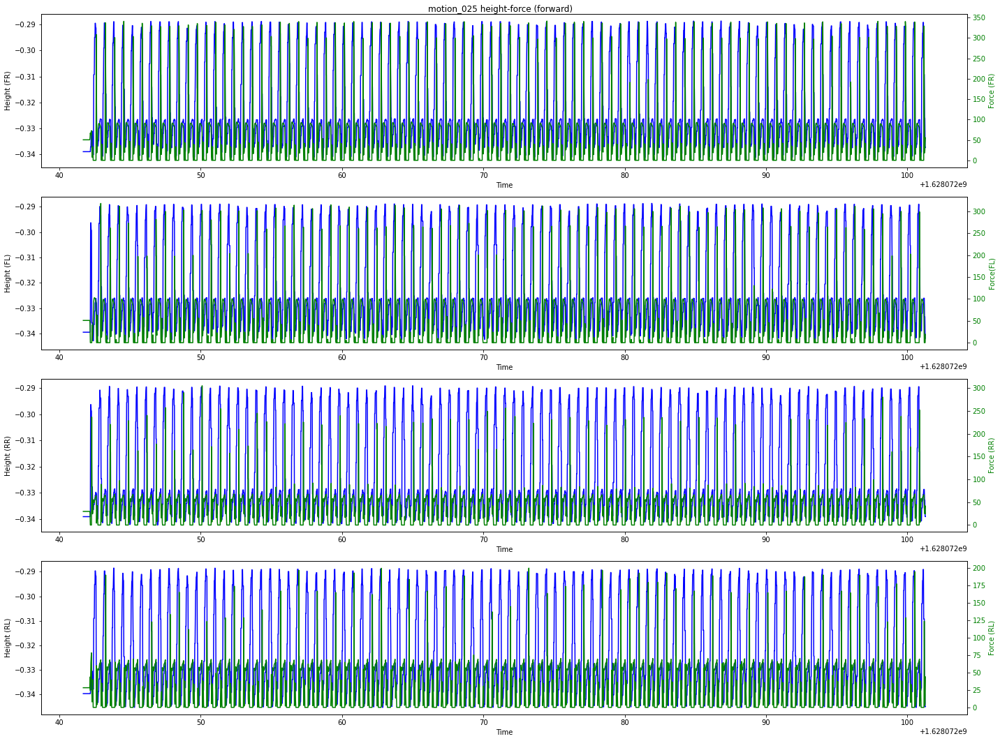

In [12]:
# Forward
fwd_cmds = get_specific_cmd(motion_025, velocity, 0, 0)
motion_025_fwd = motion_025[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (forward)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

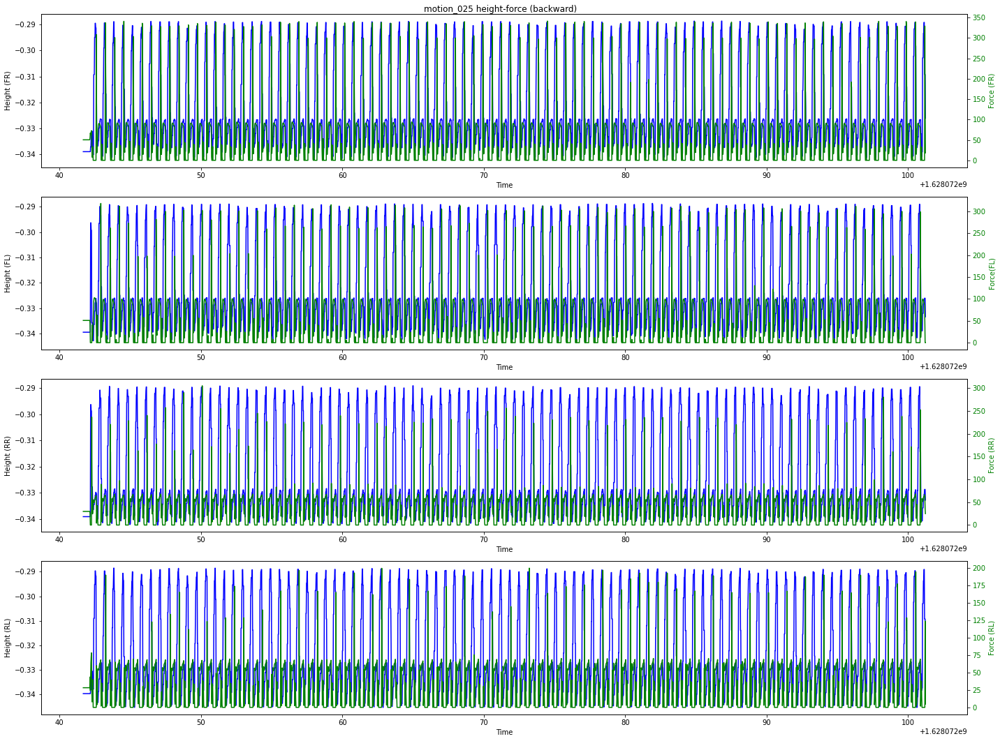

In [13]:
# Backwards
bwd_cmds = get_specific_cmd(motion_025, -velocity, 0, 0)
motion_025_bwd = motion_025[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (backward)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

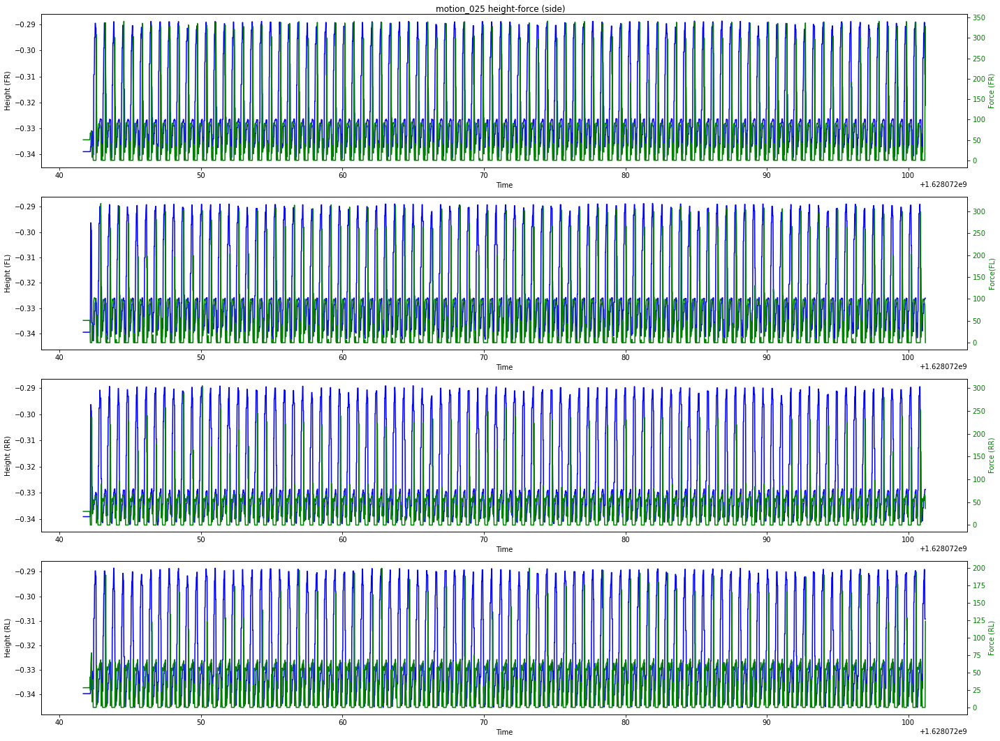

In [14]:
# Side (right)
side_cmds = get_specific_cmd(motion_025, 0, velocity, 0)
motion_025_side = motion_025[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (side)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

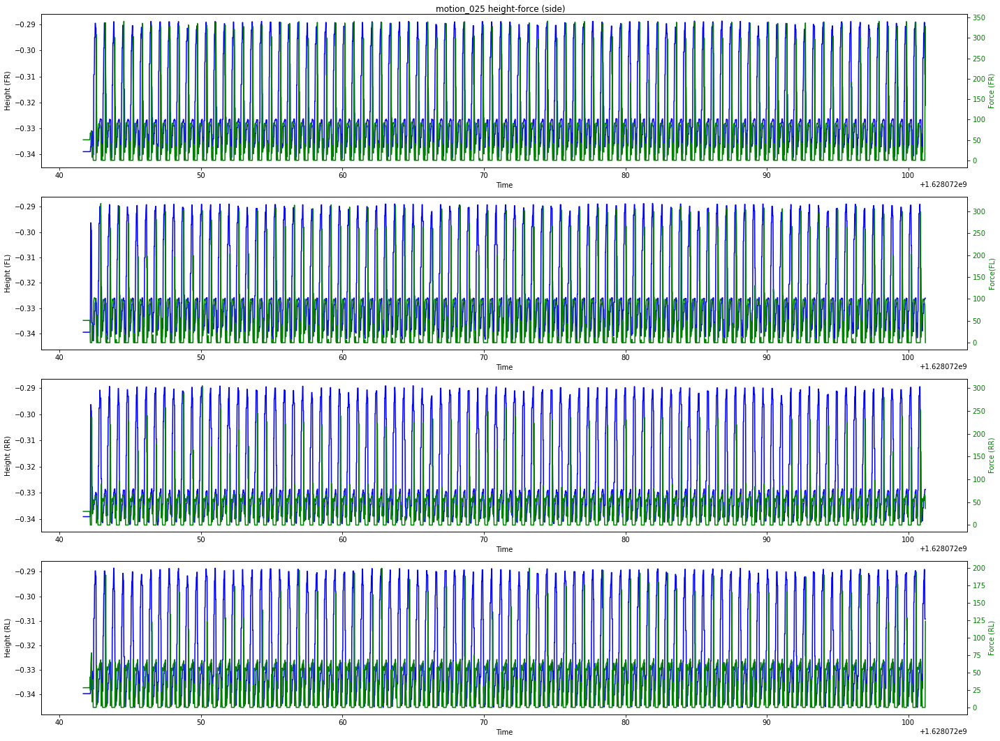

In [15]:
# Side (left)
side_cmds = get_specific_cmd(motion_025, 0, -velocity, 0)
motion_025_side = motion_025[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (side)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

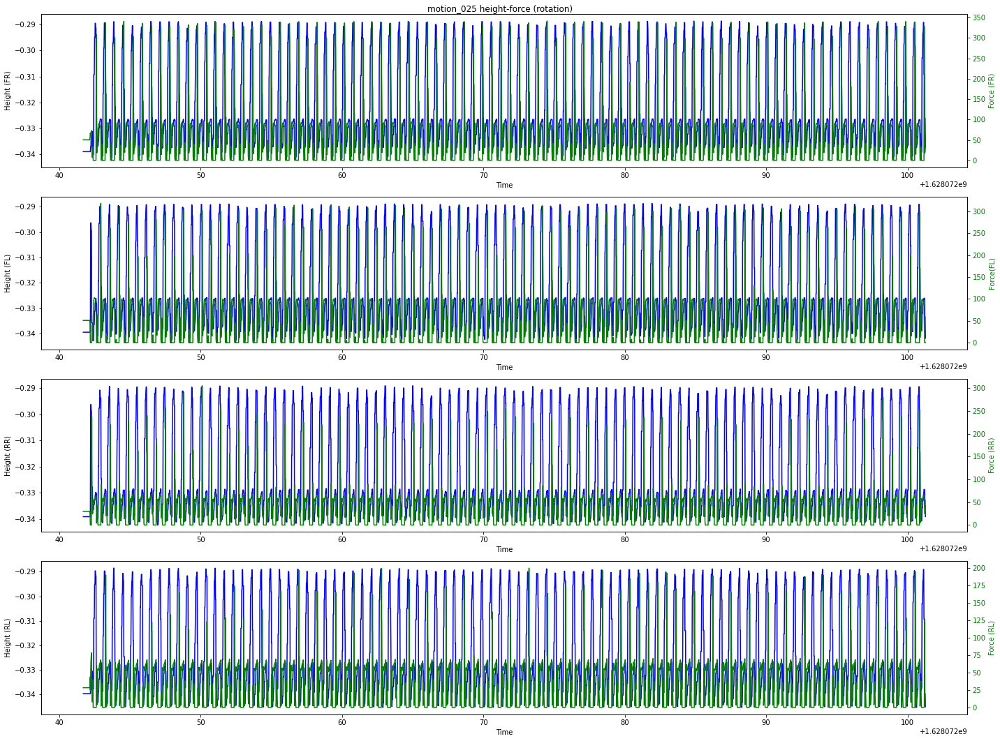

In [16]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion_025, 0, 0, velocity)
motion_025_rot = motion_025[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (rotation)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

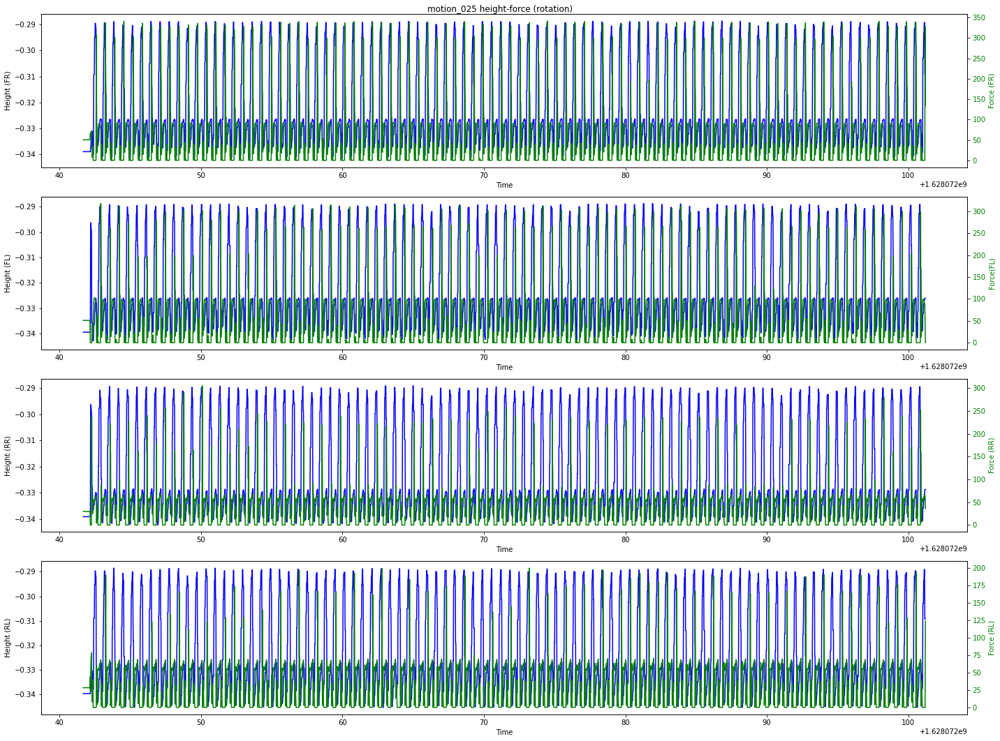

In [17]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion_025, 0, 0, -velocity)
motion_025_rot = motion_025[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_025_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_025 height-force (rotation)",
                      motion_025,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [9, 21, 12, 24, 15, 27, 18, 30])

## Footsteps Extraction (Height + Force)

In [18]:
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 9] - dataset[:, 12]), 9)
    print("Max diff between fr and fl: ", max(fr_fl_diff))

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 15] - dataset[:, 18]), 9)
    print("Max diff between rr and rl: ", max(rr_rl_diff))

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Find footsteps based on force perceived
    rear_force_footsteps = np.where(np.logical_or(dataset[:, 21] <= force_thresholds[0], dataset[:, 24] <= force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_or(dataset[:, 27] <= force_thresholds[2], dataset[:, 30] <= force_thresholds[3]))[0]
    
     # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    return force_height_footsteps

"""
def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    footsteps_sort, timestamps_sort = zip(*sorted(zip(footsteps, dataset[footsteps, 0])))

    for idx, footstep_sort in enumerate(footsteps_sort):
        if idx > 0:
            if abs(dataset[footstep_sort, 0] - dataset[footsteps_sort[idx-1], 0]) < 0.15:
                continue
            else:
                footsteps_nms.append(footstep_sort)
        else:
            footsteps_nms.append(footstep_sort)

    return np.asarray(footsteps_nms)
"""

def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    prev_similar = False
    footstep_to_add = footsteps[0]
    
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            if abs(dataset[footstep, 0] - dataset[footsteps[idx+1], 0]) < 0.15:
                footstep_to_add = footstep if dataset[footstep, 9] < dataset[footsteps[idx+1], 9] else footsteps[idx+1]
            else:
                footsteps_nms.append(footstep_to_add)
                
                # Account for next entry
                footstep_to_add = footsteps[idx+1]

    return np.asarray(footsteps_nms)

## Footsteps

In [19]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_025_cmds = motion_025[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_025_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_025_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_025_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_025_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [9, 21, 12, 24, 15, 27, 18, 30],
                           True,
                           motion_025_cmds[footsteps_nms(motion_025_cmds, footsteps), 0])
    
    return motion_025_cmds, footsteps_after_nms

### Forward motion

Foot swinging motions lenghts:  2978 2978 2978 2978
Max diff between fr and fl:  0.040675014
Max diff between rr and rl:  0.041653305
Min and max diff between front and rear feet 0.000920922 0.082327664 

Amount of footsteps found with height criteria:  1225 

Number of force footsteps:  2556 

Number of height-force footsteps:  954 

Footsteps extracted:  954
Footsteps after non-maximum-suppression:  181


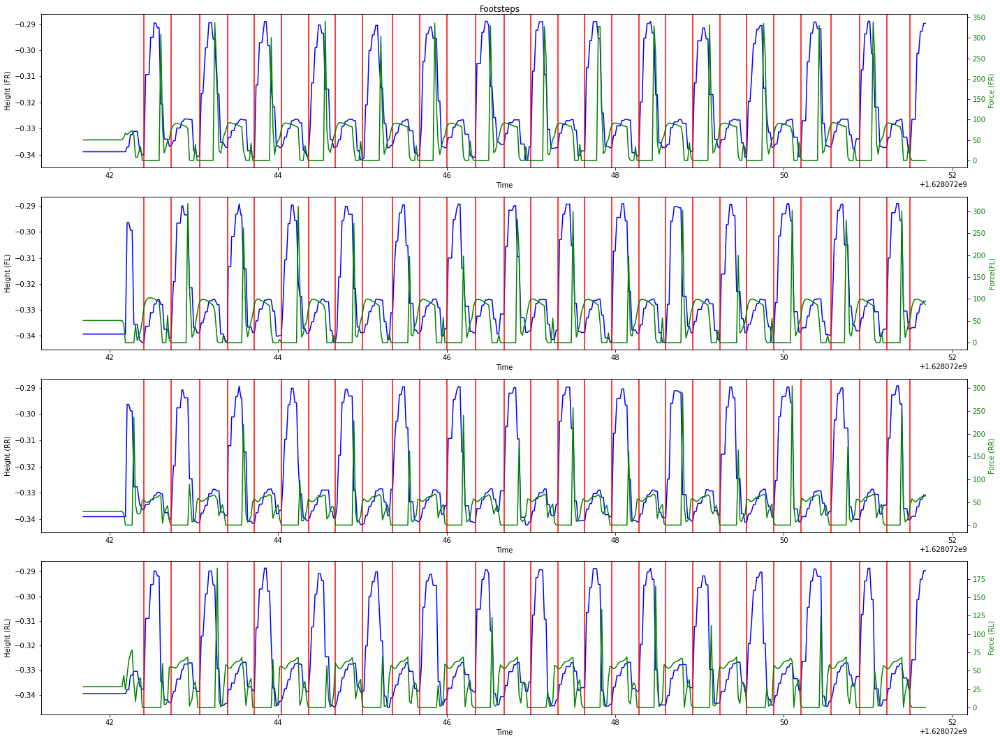

In [20]:
motion_025_fwd, footsteps_025_fwd = footstep_extraction_and_plotting(dataset=motion_025, velocities=[velocity, 0, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 500))

### Backward motion

Foot swinging motions lenghts:  2975 2975 2975 2975
Max diff between fr and fl:  0.047714353
Max diff between rr and rl:  0.050919533
Min and max diff between front and rear feet 0.000548363 0.098633886 

Amount of footsteps found with height criteria:  1200 

Number of force footsteps:  2476 

Number of height-force footsteps:  855 

Footsteps extracted:  855
Footsteps after non-maximum-suppression:  181


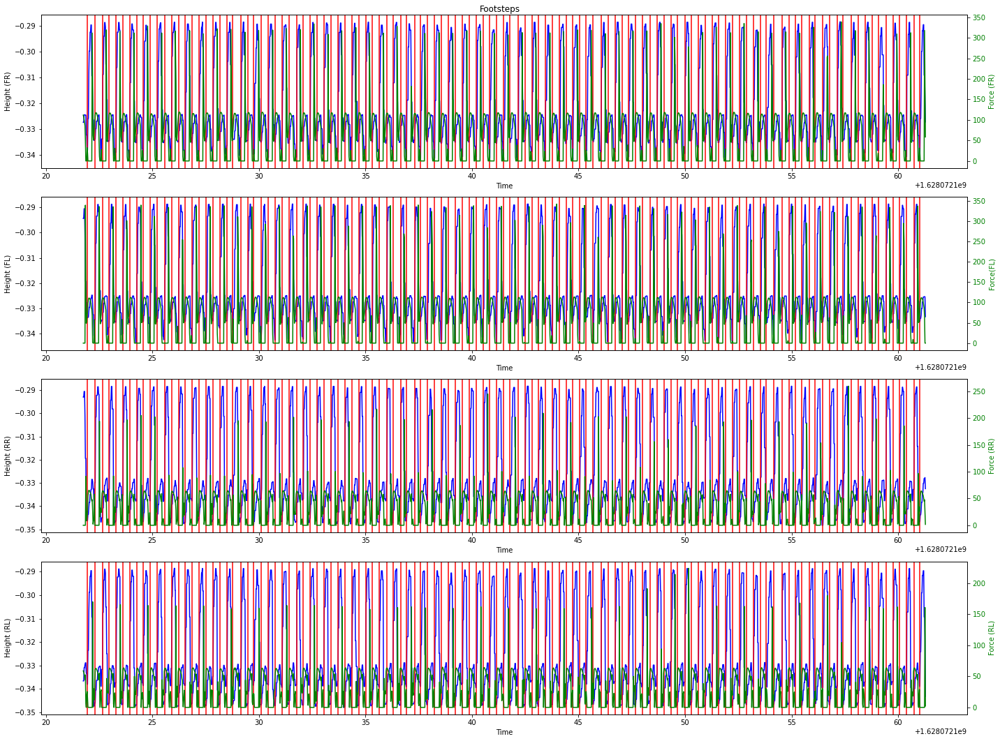

In [21]:
motion_025_bwd, footsteps_025_bwd = footstep_extraction_and_plotting(dataset=motion_025, velocities=[-velocity, 0, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(1000, 2975))

### Side motion (right)

Foot swinging motions lenghts:  2974 2974 2974 2974
Max diff between fr and fl:  0.048647255
Max diff between rr and rl:  0.051384985
Min and max diff between front and rear feet 4.8011e-05 0.097017855 

Amount of footsteps found with height criteria:  1143 

Number of force footsteps:  2472 

Number of height-force footsteps:  794 

Footsteps extracted:  794
Footsteps after non-maximum-suppression:  179


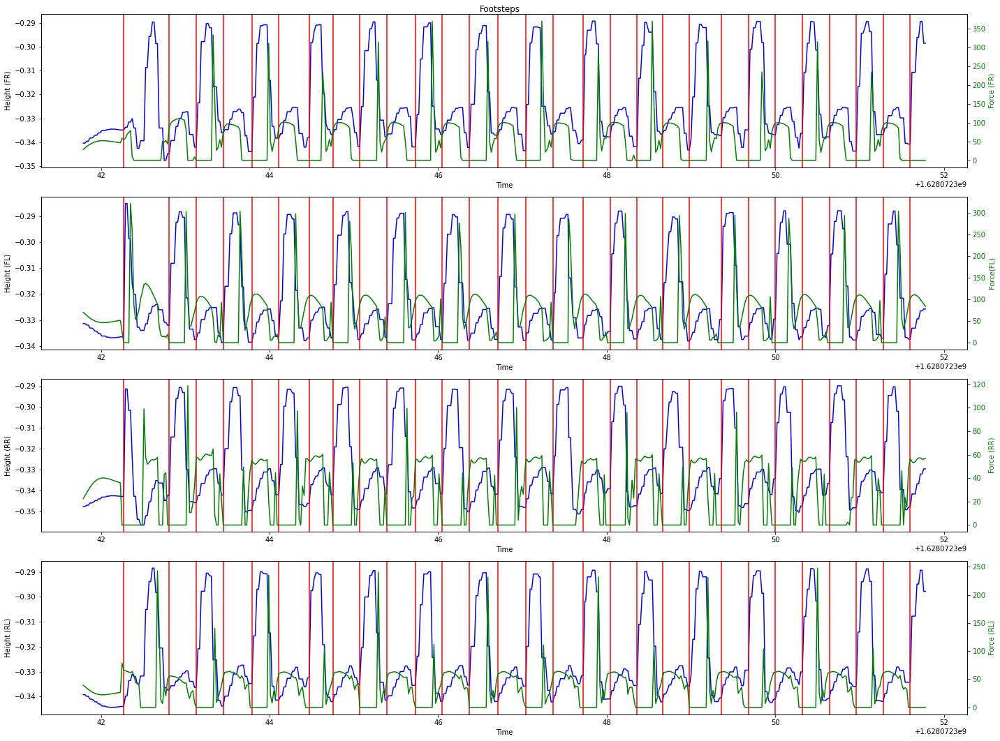

In [22]:
motion_025_side_right, footsteps_025_side_right = footstep_extraction_and_plotting(dataset=motion_025, velocities=[0, velocity, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 500))

### Side (left)

Foot swinging motions lenghts:  2974 2974 2974 2974
Max diff between fr and fl:  0.046481699
Max diff between rr and rl:  0.051195115
Min and max diff between front and rear feet 9.0271e-05 0.097676814 

Amount of footsteps found with height criteria:  1071 

Number of force footsteps:  2534 

Number of height-force footsteps:  780 

Footsteps extracted:  780
Footsteps after non-maximum-suppression:  179


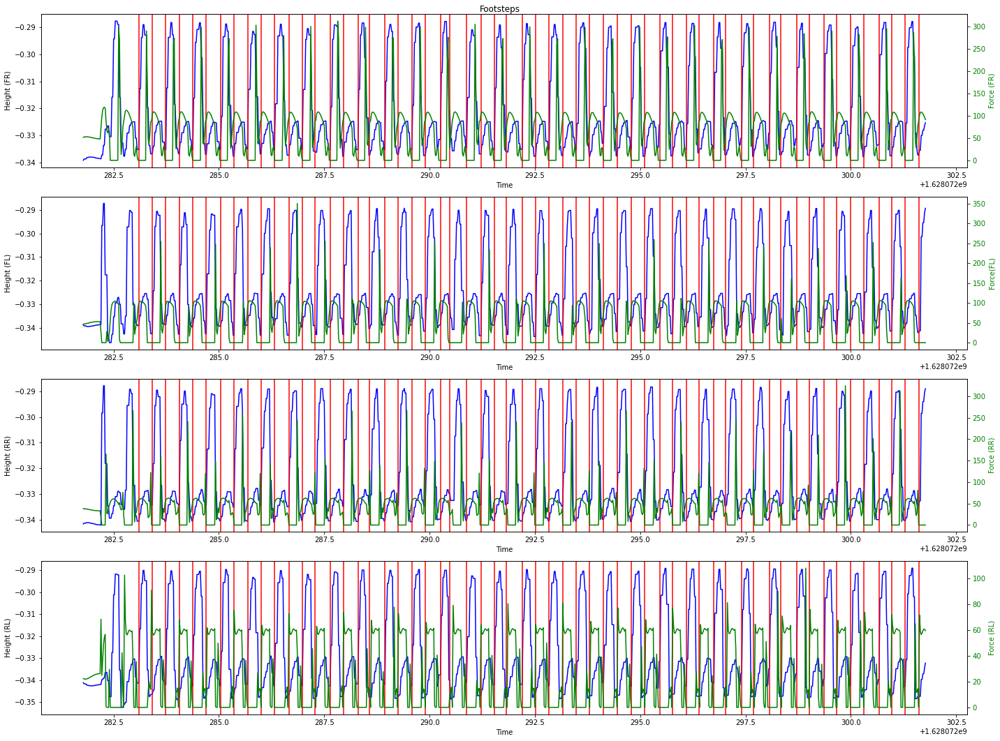

In [23]:
motion_025_side_left, footsteps_025_side_left = footstep_extraction_and_plotting(dataset=motion_025, velocities=[0, -velocity, 0], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Rotation (clockwise)

Foot swinging motions lenghts:  2977 2977 2977 2977
Max diff between fr and fl:  0.042306036
Max diff between rr and rl:  0.044418514
Min and max diff between front and rear feet 8.9198e-05 0.086723089 

Amount of footsteps found with height criteria:  1250 

Number of force footsteps:  2537 

Number of height-force footsteps:  984 

Footsteps extracted:  984
Footsteps after non-maximum-suppression:  181


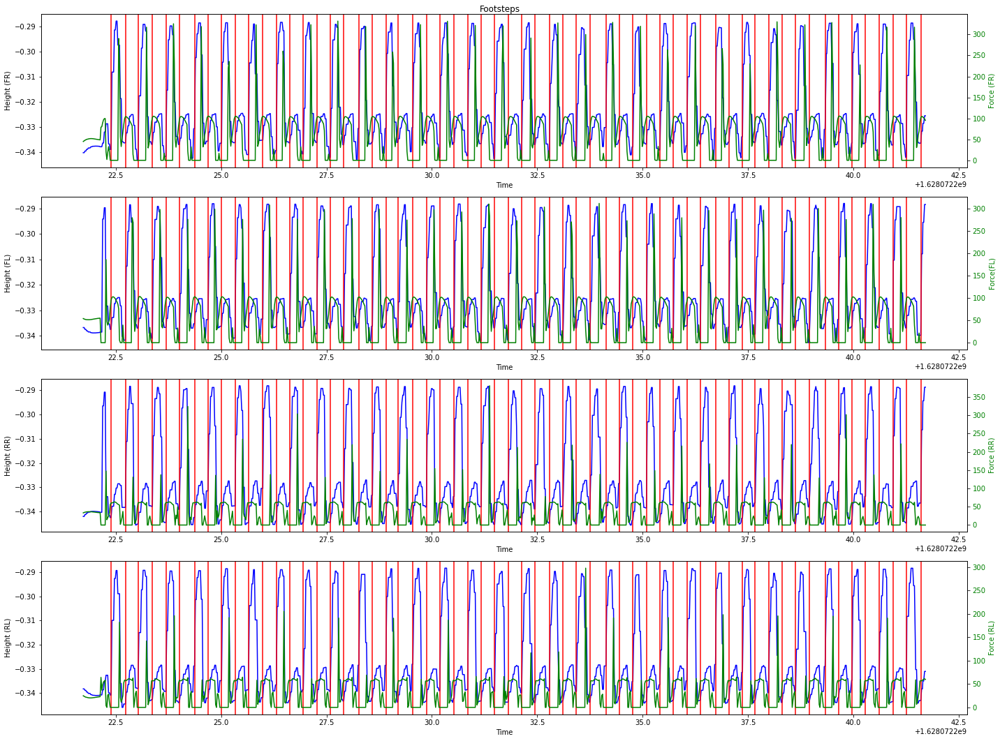

In [24]:
motion_025_clock, footsteps_025_clock = footstep_extraction_and_plotting(dataset=motion_025, velocities=[0, 0, velocity], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  2974 2974 2974 2974
Max diff between fr and fl:  0.049813837
Max diff between rr and rl:  0.049728692
Min and max diff between front and rear feet 8.2255e-05 0.099542529 

Amount of footsteps found with height criteria:  1245 

Number of force footsteps:  2513 

Number of height-force footsteps:  933 

Footsteps extracted:  933
Footsteps after non-maximum-suppression:  181


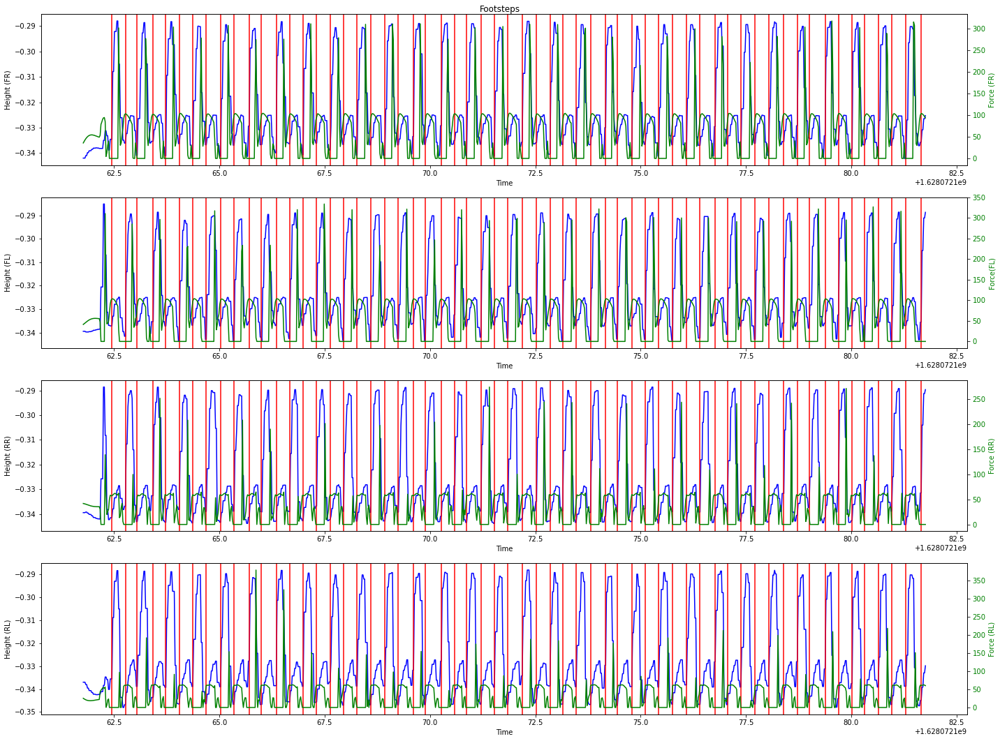

In [25]:
motion_025_count, footsteps_025_count = footstep_extraction_and_plotting(dataset=motion_025, velocities=[0, 0, -velocity], height_threshold=0.02, force_thresholds=[20,20,20,20], indexes=range(0, 1000))

### Step size

In [26]:
def get_step_size(dataset, footsteps, idx_coord=[7,10,13,16]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]

            if time_diff < 1.5:
                footstep_period.append(time_diff)
                step_size_fl.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fr.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_rl_numpy = np.array(step_size_rl)
    step_size_rr_numpy = np.array(step_size_rr)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fl_numpy = step_size_fl_numpy[np.where(step_size_fl_numpy > 0)[0]]
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_rl_numpy[np.where(step_size_rl_numpy > 0)[0]]
    step_size_rr_numpy = step_size_rr_numpy[np.where(step_size_rr_numpy > 0)[0]]
        
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [27]:
# Step size and velocity along x axis 
step_size_fr_x_fwd,_,_,_ = get_step_size(motion_025_fwd, footsteps_025_fwd)

Avg. step size time:  0.32549999952316283
Avg. step size for FL foot:  0.08086351470821111
Avg. step size for FR foot:  0.07370991342605555
Avg. step size for RL foot:  0.0790056117706
Avg. step size for RR foot:  0.07413001755877777 

Std. dev. step size for FL foot:  0.006720922208632508
Std. dev. step size for FR foot:  0.010759061465790906
Std. dev. step size for RL foot:  0.010423197888880284
Std. dev. step size for RR foot:  0.007844922083268414 



In [28]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_fwd, footsteps_025_fwd, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32549999952316283
Avg. step size for FL foot:  0.007255036466666668
Avg. step size for FR foot:  0.0014189082113977263
Avg. step size for RL foot:  0.0009138540309882338
Avg. step size for RR foot:  0.0012128722408695644 

Std. dev. step size for FL foot:  0.0010884510298259256
Std. dev. step size for FR foot:  0.0009235461202550157
Std. dev. step size for RL foot:  0.0007578984103552661
Std. dev. step size for RR foot:  0.0007788608224706511 



### Backward motion

In [29]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_025_bwd, footsteps_025_bwd)

Avg. step size time:  0.32538888851801556
Avg. step size for FL foot:  0.09311752004755557
Avg. step size for FR foot:  0.07830455319744445
Avg. step size for RL foot:  0.08788499749367777
Avg. step size for RR foot:  0.09479197396171109 

Std. dev. step size for FL foot:  0.007257709041714144
Std. dev. step size for FR foot:  0.009143164327583353
Std. dev. step size for RL foot:  0.008786696089425023
Std. dev. step size for RR foot:  0.006286501049073056 



In [30]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_bwd, footsteps_025_bwd, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32538888851801556
Avg. step size for FL foot:  0.004738232990044444
Avg. step size for FR foot:  0.00470133407248889
Avg. step size for RL foot:  0.0014209965455051557
Avg. step size for RR foot:  0.00207058184745055 

Std. dev. step size for FL foot:  0.0014433028836477262
Std. dev. step size for FR foot:  0.001015071962109743
Std. dev. step size for RL foot:  0.0009455056184900364
Std. dev. step size for RR foot:  0.0010396783674120028 



### Side motion (right)

In [31]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_025_side_right, footsteps_025_side_right)

Avg. step size time:  0.33028089866209565
Avg. step size for FL foot:  0.002152489142415728
Avg. step size for FR foot:  0.00831191208252809
Avg. step size for RL foot:  0.006510781438179779
Avg. step size for RR foot:  0.0066847037733932585 

Std. dev. step size for FL foot:  0.000826147264099527
Std. dev. step size for FR foot:  0.0017443843251139434
Std. dev. step size for RL foot:  0.0018577182935114581
Std. dev. step size for RR foot:  0.0013623748753602437 



In [32]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_side_right, footsteps_025_side_right, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.33028089866209565
Avg. step size for FL foot:  0.08478450859814773
Avg. step size for FR foot:  0.08922338385259887
Avg. step size for RL foot:  0.07459724903774269
Avg. step size for RR foot:  0.08219982625060114 

Std. dev. step size for FL foot:  0.009663800079148646
Std. dev. step size for FR foot:  0.012607199588271828
Std. dev. step size for RL foot:  0.014394481525637465
Std. dev. step size for RR foot:  0.011557965032803917 



### Side motions (left)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_025_side_left, footsteps_025_side_left)

Avg. step size time:  0.32544943857728764
Avg. step size for FL foot:  0.014848918894696628
Avg. step size for FR foot:  0.0006256650455340907
Avg. step size for RL foot:  0.0021107401070561854
Avg. step size for RR foot:  0.006271913815089884 

Std. dev. step size for FL foot:  0.001007672598213087
Std. dev. step size for FR foot:  0.0005328727478305206
Std. dev. step size for RL foot:  0.00123053968312164
Std. dev. step size for RR foot:  0.001368805487969604 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_side_left, footsteps_025_side_left, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.32544943857728764
Avg. step size for FL foot:  0.10330608654553933
Avg. step size for FR foot:  0.06841435442488089
Avg. step size for RL foot:  0.07715091460877865
Avg. step size for RR foot:  0.08783010996126066 

Std. dev. step size for FL foot:  0.006852525292010896
Std. dev. step size for FR foot:  0.007798198982748035
Std. dev. step size for RL foot:  0.005777021319332511
Std. dev. step size for RR foot:  0.007357882607084589 



### Rotation (clockwise)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_025_clock, footsteps_025_clock)

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.017164273228877775
Avg. step size for FR foot:  0.006155945857355557
Avg. step size for RL foot:  0.018128053347233334
Avg. step size for RR foot:  0.004743082986899999 

Std. dev. step size for FL foot:  0.0009595498256529739
Std. dev. step size for FR foot:  0.0012910383905195336
Std. dev. step size for RL foot:  0.0012765387790212867
Std. dev. step size for RR foot:  0.0021087176510785556 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_clock, footsteps_025_clock, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.013668352944944444
Avg. step size for FR foot:  0.01721377480357778
Avg. step size for RL foot:  0.021392632524177776
Avg. step size for RR foot:  0.02855928192534445 

Std. dev. step size for FL foot:  0.0020086491465506635
Std. dev. step size for FR foot:  0.0014357930687646614
Std. dev. step size for RL foot:  0.0023766612449982846
Std. dev. step size for RR foot:  0.0024190992328725533 



### Rotation (counter clockwise)

In [37]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_025_count, footsteps_025_count)

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.00723804318248889
Avg. step size for FR foot:  0.01377185169197778
Avg. step size for RL foot:  0.003748327493704549
Avg. step size for RR foot:  0.020182390014388884 

Std. dev. step size for FL foot:  0.0007336036022997892
Std. dev. step size for FR foot:  0.0013980632776591066
Std. dev. step size for RL foot:  0.0027633327780210728
Std. dev. step size for RR foot:  0.0016663671651997551 



In [38]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_025_count, footsteps_025_count, idx_coord=[8, 11, 14, 17])

Avg. step size time:  0.3254444440205892
Avg. step size for FL foot:  0.02097928283937778
Avg. step size for FR foot:  0.012192468510744443
Avg. step size for RL foot:  0.026459299938555555
Avg. step size for RR foot:  0.026372319790977775 

Std. dev. step size for FL foot:  0.001265989186168161
Std. dev. step size for FR foot:  0.0030413099020143055
Std. dev. step size for RL foot:  0.003569541618164786
Std. dev. step size for RR foot:  0.0020310550370632135 



### Footstep visualization

In [39]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        # 3D positions        
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zz = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 1:7]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [40]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    new_y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    new_z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
    y = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
    z = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

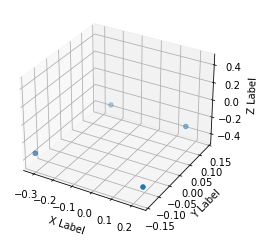


FL before: -0.34. FL after: -0.289558321238

FR before: -0.343. FR after: -0.327803641558

RL before: -0.336. RL after: -0.330953121185

RR before: -0.338. RR after: -0.289691984653
Footstep timestamp:  1628072042.41
Height check index:  42
Height check timestamp:  1628072042.53

FL moving: 0.05044167876200001. FR moving: 0.015196358442000013
RL moving: 0.005046878815000044. RR moving: 0.04830801534700002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  0
Skipping idx:  0  as flags not valid


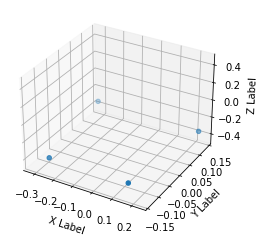


FL before: -0.337. FL after: -0.329800397158

FR before: -0.341. FR after: -0.296620458364

RL before: -0.34. RL after: -0.297638446093

RR before: -0.343. RR after: -0.333663105965
Footstep timestamp:  1628072042.73
Height check index:  57
Height check timestamp:  1628072042.84

FL moving: 0.007199602841999997. FR moving: 0.04437954163600005
RL moving: 0.04236155390700003. RR moving: 0.009336894035000043

FL moving: False. FR moving: True
RL moving: True. RR moving: False
idx:  1

Coord FL: [0.229, 0.132, -0.337]. Coord FR: [0.16, -0.138, -0.341]. Coord RL: [-0.319, 0.138, -0.34]. Coord RR: [-0.246, -0.137, -0.343]

FR step_size x: 0.149435588956. FR step_size y: 0.00879442966000002. RL step_size x: 0.14721821355799997. RL step_size x: 0.0005878716709999954.


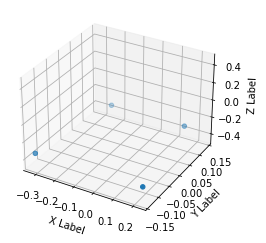


FL before: -0.341. FL after: -0.289437890053

FR before: -0.339. FR after: -0.326573878527

RL before: -0.341. RL after: -0.330402523279

RR before: -0.339. RR after: -0.289720028639
Footstep timestamp:  1628072043.07
Height check index:  75
Height check timestamp:  1628072043.19

FL moving: 0.051562109947. FR moving: 0.01242612147300004
RL moving: 0.010597476721000032. RR moving: 0.04927997136100004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  2
Skipping idx:  2  as flags not valid


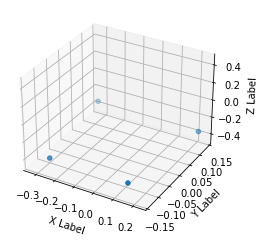


FL before: -0.337. FL after: -0.32808381319

FR before: -0.342. FR after: -0.293095260859

RL before: -0.339. RL after: -0.293330132961

RR before: -0.344. RR after: -0.331502526999
Footstep timestamp:  1628072043.4
Height check index:  91
Height check timestamp:  1628072043.52

FL moving: 0.008916186810000004. FR moving: 0.04890473914100002
RL moving: 0.045669867039. RR moving: 0.012497473000999959

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  3
Skipping idx:  3  as flags not valid


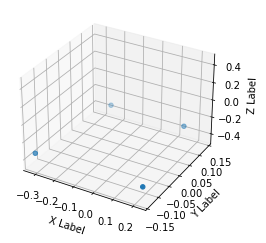


FL before: -0.341. FL after: -0.288951039314

FR before: -0.339. FR after: -0.326274335384

RL before: -0.342. RL after: -0.33004501462

RR before: -0.338. RR after: -0.288566052914
Footstep timestamp:  1628072043.72
Height check index:  107
Height check timestamp:  1628072043.84

FL moving: 0.05204896068600001. FR moving: 0.012725664615999999
RL moving: 0.011954985380000005. RR moving: 0.04943394708600002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  4
Skipping idx:  4  as flags not valid


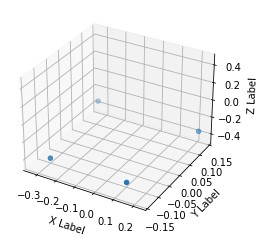


FL before: -0.337. FL after: -0.327052950859

FR before: -0.34. FR after: -0.289657324553

RL before: -0.337. RL after: -0.290155142546

RR before: -0.343. RR after: -0.329456955194
Footstep timestamp:  1628072044.04
Height check index:  123
Height check timestamp:  1628072044.16

FL moving: 0.00994704914100003. FR moving: 0.05034267544700005
RL moving: 0.04684485745400002. RR moving: 0.013543044806000049

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  5
Skipping idx:  5  as flags not valid


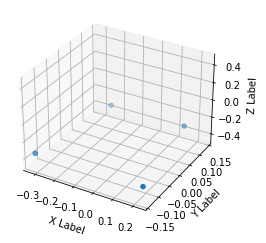


FL before: -0.341. FL after: -0.290321290493

FR before: -0.339. FR after: -0.32696801424

RL before: -0.341. RL after: -0.330986440182

RR before: -0.339. RR after: -0.290667146444
Footstep timestamp:  1628072044.36
Height check index:  139
Height check timestamp:  1628072044.48

FL moving: 0.05067870950700004. FR moving: 0.01203198576000003
RL moving: 0.010013559818000006. RR moving: 0.04833285355600003

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  6
Skipping idx:  6  as flags not valid


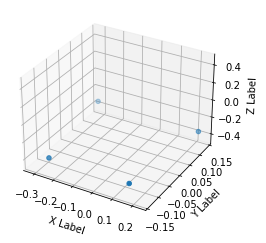


FL before: -0.337. FL after: -0.3271715343

FR before: -0.343. FR after: -0.290133476257

RL before: -0.34. RL after: -0.290606528521

RR before: -0.345. RR after: -0.329882264137
Footstep timestamp:  1628072044.68
Height check index:  155
Height check timestamp:  1628072044.8

FL moving: 0.00982846570000001. FR moving: 0.05286652374300005
RL moving: 0.04939347147900003. RR moving: 0.01511773586299997

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  7
Skipping idx:  7  as flags not valid


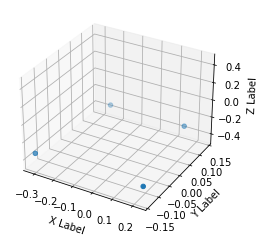


FL before: -0.342. FL after: -0.294112563133

FR before: -0.339. FR after: -0.328514367342

RL before: -0.342. RL after: -0.333267837763

RR before: -0.339. RR after: -0.294021487236
Footstep timestamp:  1628072045.0
Height check index:  171
Height check timestamp:  1628072045.12

FL moving: 0.04788743686700003. FR moving: 0.01048563265800001
RL moving: 0.008732162237000018. RR moving: 0.044978512764

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  8
Skipping idx:  8  as flags not valid


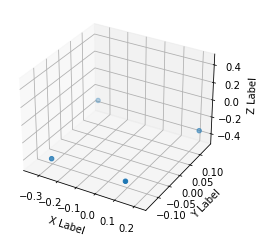


FL before: -0.336. FL after: -0.327151030302

FR before: -0.331. FR after: -0.289593279362

RL before: -0.329. RL after: -0.289608925581

RR before: -0.341. RR after: -0.329228579998
Footstep timestamp:  1628072045.36
Height check index:  189
Height check timestamp:  1628072045.48

FL moving: 0.008848969698000031. FR moving: 0.041406720637999994
RL moving: 0.03939107441900003. RR moving: 0.011771420002000044

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  9
Skipping idx:  9  as flags not valid


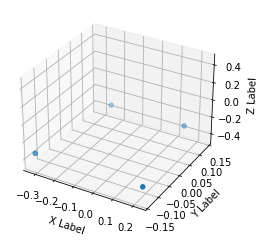


FL before: -0.34. FL after: -0.291097819805

FR before: -0.339. FR after: -0.327417045832

RL before: -0.341. RL after: -0.331586271524

RR before: -0.339. RR after: -0.291097611189
Footstep timestamp:  1628072045.68
Height check index:  205
Height check timestamp:  1628072045.8

FL moving: 0.04890218019500003. FR moving: 0.011582954168000037
RL moving: 0.009413728476000027. RR moving: 0.04790238881100001

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  10
Skipping idx:  10  as flags not valid


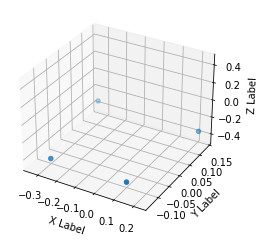


FL before: -0.337. FL after: -0.327852070332

FR before: -0.337. FR after: -0.291087150574

RL before: -0.335. RL after: -0.291000336409

RR before: -0.342. RR after: -0.330144882202
Footstep timestamp:  1628072046.0
Height check index:  221
Height check timestamp:  1628072046.12

FL moving: 0.009147929668000043. FR moving: 0.045912849426000046
RL moving: 0.04399966359099999. RR moving: 0.011855117798000026

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  11
Skipping idx:  11  as flags not valid


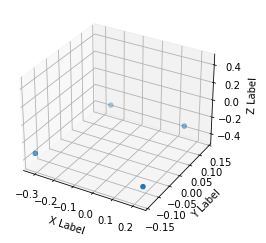


FL before: -0.341. FL after: -0.288865417242

FR before: -0.339. FR after: -0.326222300529

RL before: -0.341. RL after: -0.330098927021

RR before: -0.339. RR after: -0.289227873087
Footstep timestamp:  1628072046.34
Height check index:  238
Height check timestamp:  1628072046.46

FL moving: 0.052134582758000036. FR moving: 0.012777699471000048
RL moving: 0.010901072979000004. RR moving: 0.04977212691300004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  12
Skipping idx:  12  as flags not valid


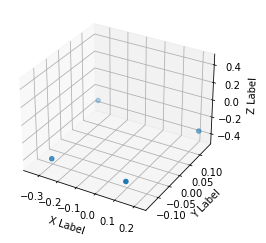


FL before: -0.336. FL after: -0.326673299074

FR before: -0.332. FR after: -0.289910078049

RL before: -0.329. RL after: -0.289930909872

RR before: -0.341. RR after: -0.327827841043
Footstep timestamp:  1628072046.68
Height check index:  255
Height check timestamp:  1628072046.8

FL moving: 0.00932670092600002. FR moving: 0.04208992195100003
RL moving: 0.03906909012800003. RR moving: 0.013172158957000024

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  13
Skipping idx:  13  as flags not valid


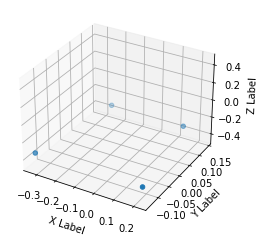


FL before: -0.337. FL after: -0.289032518864

FR before: -0.338. FR after: -0.326061159372

RL before: -0.341. RL after: -0.329996436834

RR before: -0.335. RR after: -0.289195984602
Footstep timestamp:  1628072047.0
Height check index:  271
Height check timestamp:  1628072047.12

FL moving: 0.04796748113600002. FR moving: 0.011938840628000047
RL moving: 0.011003563166000041. RR moving: 0.045804015398

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  14
Skipping idx:  14  as flags not valid


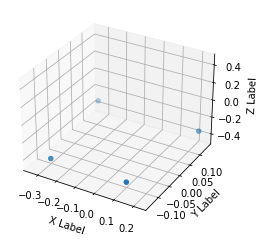


FL before: -0.337. FL after: -0.326971381903

FR before: -0.338. FR after: -0.289300054312

RL before: -0.334. RL after: -0.289730787277

RR before: -0.342. RR after: -0.328593283892
Footstep timestamp:  1628072047.32
Height check index:  287
Height check timestamp:  1628072047.44

FL moving: 0.010028618097000008. FR moving: 0.04869994568800001
RL moving: 0.044269212722999995. RR moving: 0.013406716108000039

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  15
Skipping idx:  15  as flags not valid


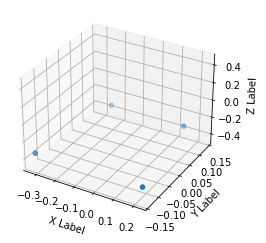


FL before: -0.339. FL after: -0.288990676403

FR before: -0.339. FR after: -0.326387733221

RL before: -0.341. RL after: -0.330318063498

RR before: -0.337. RR after: -0.288738459349
Footstep timestamp:  1628072047.64
Height check index:  303
Height check timestamp:  1628072047.76

FL moving: 0.050009323597. FR moving: 0.012612266779000014
RL moving: 0.010681936502. RR moving: 0.04826154065100002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  16
Skipping idx:  16  as flags not valid


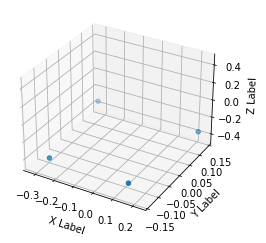


FL before: -0.337. FL after: -0.326911509037

FR before: -0.342. FR after: -0.289115250111

RL before: -0.339. RL after: -0.290406435728

RR before: -0.344. RR after: -0.329007446766
Footstep timestamp:  1628072047.96
Height check index:  319
Height check timestamp:  1628072048.08

FL moving: 0.010088490963000019. FR moving: 0.05288474988900005
RL moving: 0.04859356427200001. RR moving: 0.01499255323399995

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  17
Skipping idx:  17  as flags not valid


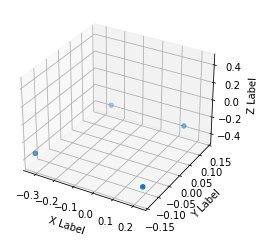


FL before: -0.34. FL after: -0.289766252041

FR before: -0.339. FR after: -0.326670050621

RL before: -0.341. RL after: -0.330832481384

RR before: -0.339. RR after: -0.29008859396
Footstep timestamp:  1628072048.28
Height check index:  335
Height check timestamp:  1628072048.4

FL moving: 0.05023374795900004. FR moving: 0.012329949379000005
RL moving: 0.010167518616000015. RR moving: 0.04891140604000005

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  18
Skipping idx:  18  as flags not valid


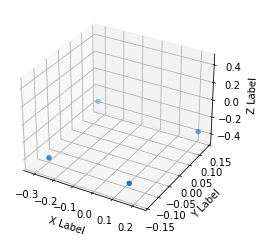


FL before: -0.337. FL after: -0.327448070049

FR before: -0.342. FR after: -0.290271371603

RL before: -0.34. RL after: -0.291131913662

RR before: -0.344. RR after: -0.330045193434
Footstep timestamp:  1628072048.6
Height check index:  351
Height check timestamp:  1628072048.72

FL moving: 0.009551929951000016. FR moving: 0.05172862839700004
RL moving: 0.04886808633800005. RR moving: 0.013954806565999955

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  19
Skipping idx:  19  as flags not valid


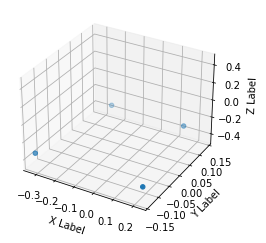


FL before: -0.339. FL after: -0.291468143463

FR before: -0.339. FR after: -0.327383697033

RL before: -0.341. RL after: -0.331644773483

RR before: -0.337. RR after: -0.29169178009
Footstep timestamp:  1628072048.92
Height check index:  367
Height check timestamp:  1628072049.04

FL moving: 0.04753185653700004. FR moving: 0.011616302967000003
RL moving: 0.009355226517000048. RR moving: 0.04530821991

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  20
Skipping idx:  20  as flags not valid


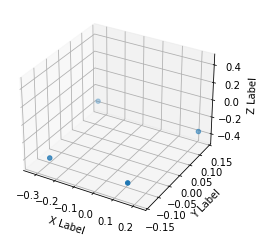


FL before: -0.337. FL after: -0.327098935843

FR before: -0.342. FR after: -0.289355129004

RL before: -0.338. RL after: -0.2897105515

RR before: -0.343. RR after: -0.329237908125
Footstep timestamp:  1628072049.24
Height check index:  383
Height check timestamp:  1628072049.36

FL moving: 0.009901064157000039. FR moving: 0.052644870996000015
RL moving: 0.0482894485. RR moving: 0.013762091875000049

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  21
Skipping idx:  21  as flags not valid


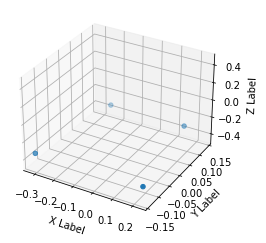


FL before: -0.341. FL after: -0.291976541281

FR before: -0.339. FR after: -0.32756242156

RL before: -0.341. RL after: -0.332176268101

RR before: -0.339. RR after: -0.292271405458
Footstep timestamp:  1628072049.56
Height check index:  399
Height check timestamp:  1628072049.68

FL moving: 0.049023458719000046. FR moving: 0.01143757844000004
RL moving: 0.008823731899000042. RR moving: 0.04672859454200001

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  22
Skipping idx:  22  as flags not valid


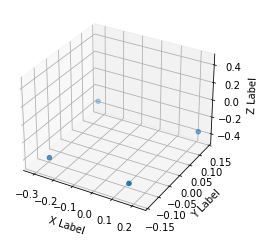


FL before: -0.337. FL after: -0.328352123499

FR before: -0.343. FR after: -0.293018460274

RL before: -0.339. RL after: -0.293271780014

RR before: -0.344. RR after: -0.331592977047
Footstep timestamp:  1628072049.88
Height check index:  415
Height check timestamp:  1628072050.0

FL moving: 0.008647876501000018. FR moving: 0.049981539726
RL moving: 0.04572821998600002. RR moving: 0.012407022952999947

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  23
Skipping idx:  23  as flags not valid


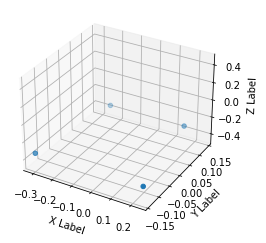


FL before: -0.341. FL after: -0.293439149857

FR before: -0.339. FR after: -0.328205049038

RL before: -0.341. RL after: -0.332788556814

RR before: -0.338. RR after: -0.293769687414
Footstep timestamp:  1628072050.2
Height check index:  431
Height check timestamp:  1628072050.32

FL moving: 0.047560850143000044. FR moving: 0.010794950962000005
RL moving: 0.008211443186000034. RR moving: 0.04423031258600002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  24
Skipping idx:  24  as flags not valid


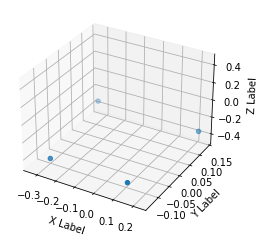


FL before: -0.337. FL after: -0.32641685009

FR before: -0.34. FR after: -0.289302051067

RL before: -0.337. RL after: -0.290040344

RR before: -0.343. RR after: -0.328327178955
Footstep timestamp:  1628072050.56
Height check index:  449
Height check timestamp:  1628072050.68

FL moving: 0.010583149910000034. FR moving: 0.050697948933
RL moving: 0.046959656000000016. RR moving: 0.014672821045000006

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  25
Skipping idx:  25  as flags not valid


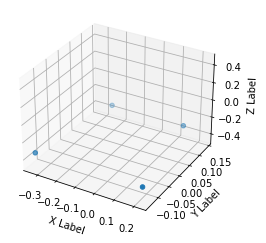


FL before: -0.334. FL after: -0.288902312517

FR before: -0.338. FR after: -0.32635012269

RL before: -0.34. RL after: -0.33000254631

RR before: -0.333. RR after: -0.288602024317
Footstep timestamp:  1628072050.9
Height check index:  466
Height check timestamp:  1628072051.02

FL moving: 0.045097687483000026. FR moving: 0.01164987731
RL moving: 0.009997453690000047. RR moving: 0.044397975683000024

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  26
Skipping idx:  26  as flags not valid


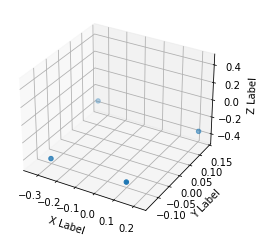


FL before: -0.337. FL after: -0.326938211918

FR before: -0.337. FR after: -0.289058804512

RL before: -0.335. RL after: -0.289250463247

RR before: -0.342. RR after: -0.328592628241
Footstep timestamp:  1628072051.22
Height check index:  482
Height check timestamp:  1628072051.34

FL moving: 0.010061788082000034. FR moving: 0.04794119548800002
RL moving: 0.04574953675300003. RR moving: 0.01340737175900003

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  27
Skipping idx:  27  as flags not valid


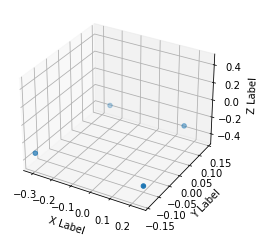


FL before: -0.339. FL after: -0.292772054672

FR before: -0.337. FR after: -0.32785397768

RL before: -0.34. RL after: -0.332487851381

RR before: -0.337. RR after: -0.293081253767
Footstep timestamp:  1628072051.5
Height check index:  496
Height check timestamp:  1628072051.62

FL moving: 0.04622794532800001. FR moving: 0.009146022320000002
RL moving: 0.007512148619000014. RR moving: 0.04391874623300002

FL moving: True. FR moving: False
RL moving: False. RR moving: True
idx:  28

Coord FL: [0.155, 0.14, -0.339]. Coord FR: [0.236, -0.134, -0.337]. Coord RL: [-0.24, 0.137, -0.34]. Coord RR: [-0.31, -0.139, -0.337]

FR step_size x: 0.16708366549. FR step_size y: 0.009905221820000004. RL step_size x: 0.16167575836200004. RL step_size x: 0.004079855443000019.


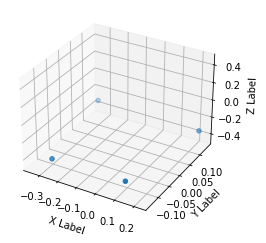


FL before: -0.336. FL after: -0.326588779688

FR before: -0.331. FR after: -0.28904312849

RL before: -0.329. RL after: -0.289826601744

RR before: -0.341. RR after: -0.328444123268
Footstep timestamp:  1628072051.86
Height check index:  514
Height check timestamp:  1628072051.98

FL moving: 0.009411220312000035. FR moving: 0.04195687150999999
RL moving: 0.039173398256000025. RR moving: 0.012555876732000038

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  29
Skipping idx:  29  as flags not valid


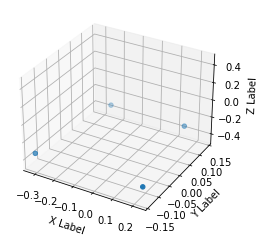


FL before: -0.341. FL after: -0.289082378149

FR before: -0.339. FR after: -0.326233386993

RL before: -0.341. RL after: -0.330638080835

RR before: -0.339. RR after: -0.28942206502
Footstep timestamp:  1628072052.18
Height check index:  530
Height check timestamp:  1628072052.3

FL moving: 0.05191762185100002. FR moving: 0.01276661300700005
RL moving: 0.01036191916500001. RR moving: 0.049577934980000016

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  30
Skipping idx:  30  as flags not valid


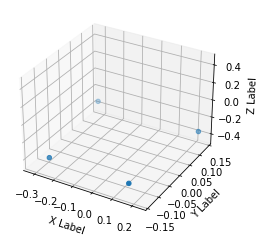


FL before: -0.337. FL after: -0.327158868313

FR before: -0.343. FR after: -0.289843678474

RL before: -0.34. RL after: -0.289880812168

RR before: -0.344. RR after: -0.329941779375
Footstep timestamp:  1628072052.5
Height check index:  546
Height check timestamp:  1628072052.62

FL moving: 0.009841131687000015. FR moving: 0.05315632152600003
RL moving: 0.050119187832000034. RR moving: 0.01405822062499995

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  31
Skipping idx:  31  as flags not valid


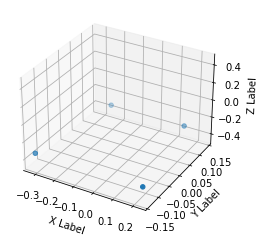


FL before: -0.34. FL after: -0.289279878139

FR before: -0.339. FR after: -0.326661229134

RL before: -0.341. RL after: -0.330474406481

RR before: -0.338. RR after: -0.28915515542
Footstep timestamp:  1628072052.82
Height check index:  562
Height check timestamp:  1628072052.94

FL moving: 0.050720121861. FR moving: 0.012338770866000048
RL moving: 0.01052559351900001. RR moving: 0.048844844580000046

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  32
Skipping idx:  32  as flags not valid


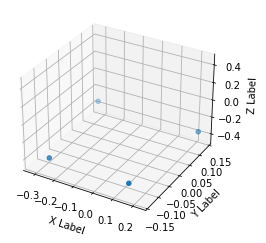


FL before: -0.337. FL after: -0.327512919903

FR before: -0.342. FR after: -0.29032060504

RL before: -0.339. RL after: -0.290446162224

RR before: -0.344. RR after: -0.32992118597
Footstep timestamp:  1628072053.14
Height check index:  578
Height check timestamp:  1628072053.26

FL moving: 0.009487080097. FR moving: 0.051679394960000014
RL moving: 0.04855383777600003. RR moving: 0.014078814029999998

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  33
Skipping idx:  33  as flags not valid


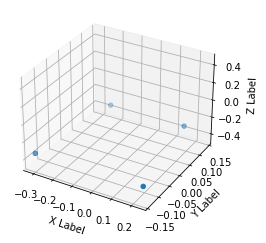


FL before: -0.342. FL after: -0.292191028595

FR before: -0.339. FR after: -0.327624797821

RL before: -0.342. RL after: -0.332176089287

RR before: -0.339. RR after: -0.292415082455
Footstep timestamp:  1628072053.46
Height check index:  594
Height check timestamp:  1628072053.58

FL moving: 0.04980897140500001. FR moving: 0.01137520217900001
RL moving: 0.00982391071300004. RR moving: 0.04658491754500005

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  34
Skipping idx:  34  as flags not valid


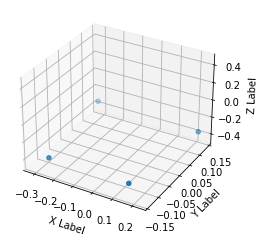


FL before: -0.337. FL after: -0.327639698982

FR before: -0.343. FR after: -0.290771484375

RL before: -0.339. RL after: -0.290779441595

RR before: -0.344. RR after: -0.329812049866
Footstep timestamp:  1628072053.78
Height check index:  610
Height check timestamp:  1628072053.9

FL moving: 0.009360301018000006. FR moving: 0.05222851562500003
RL moving: 0.048220558405. RR moving: 0.014187950133999983

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  35
Skipping idx:  35  as flags not valid


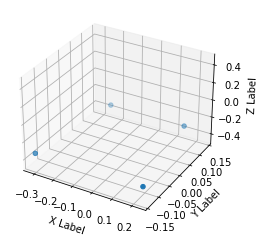


FL before: -0.341. FL after: -0.290145993233

FR before: -0.339. FR after: -0.326958686113

RL before: -0.341. RL after: -0.331322282553

RR before: -0.339. RR after: -0.289991080761
Footstep timestamp:  1628072054.12
Height check index:  627
Height check timestamp:  1628072054.24

FL moving: 0.050854006767000026. FR moving: 0.012041313887000027
RL moving: 0.009677717447000023. RR moving: 0.049008919239000026

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  36
Skipping idx:  36  as flags not valid


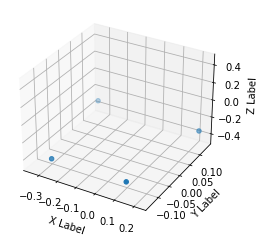


FL before: -0.337. FL after: -0.327988445759

FR before: -0.335. FR after: -0.292197972536

RL before: -0.333. RL after: -0.29281899333

RR before: -0.342. RR after: -0.330966025591
Footstep timestamp:  1628072054.48
Height check index:  644
Height check timestamp:  1628072054.59

FL moving: 0.00901155424100003. FR moving: 0.042802027464000025
RL moving: 0.04018100667000002. RR moving: 0.011033974409000002

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  37
Skipping idx:  37  as flags not valid


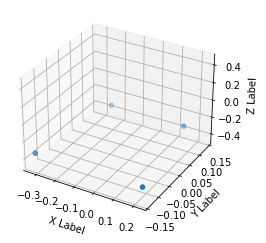


FL before: -0.339. FL after: -0.28910985589

FR before: -0.339. FR after: -0.326434850693

RL before: -0.341. RL after: -0.330265522003

RR before: -0.337. RR after: -0.288849204779
Footstep timestamp:  1628072054.81
Height check index:  661
Height check timestamp:  1628072054.93

FL moving: 0.049890144110000034. FR moving: 0.012565149307000034
RL moving: 0.010734477997000003. RR moving: 0.04815079522100002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  38
Skipping idx:  38  as flags not valid


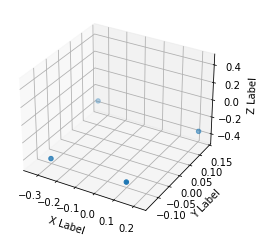


FL before: -0.337. FL after: -0.326803475618

FR before: -0.337. FR after: -0.289221674204

RL before: -0.335. RL after: -0.28998285532

RR before: -0.342. RR after: -0.329170674086
Footstep timestamp:  1628072055.13
Height check index:  677
Height check timestamp:  1628072055.25

FL moving: 0.010196524382000027. FR moving: 0.047778325796
RL moving: 0.04501714468000001. RR moving: 0.012829325914000045

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  39
Skipping idx:  39  as flags not valid


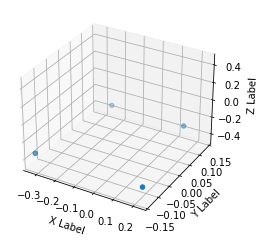


FL before: -0.339. FL after: -0.289142519236

FR before: -0.339. FR after: -0.32653093338

RL before: -0.341. RL after: -0.330497503281

RR before: -0.338. RR after: -0.289094001055
Footstep timestamp:  1628072055.45
Height check index:  693
Height check timestamp:  1628072055.57

FL moving: 0.04985748076400004. FR moving: 0.012469066620000024
RL moving: 0.010502496718999998. RR moving: 0.04890599894500003

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  40
Skipping idx:  40  as flags not valid


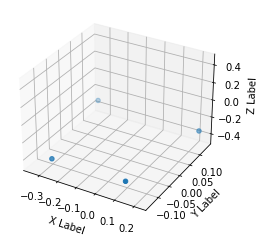


FL before: -0.337. FL after: -0.326506108046

FR before: -0.331. FR after: -0.290784657001

RL before: -0.329. RL after: -0.290952056646

RR before: -0.341. RR after: -0.327741742134
Footstep timestamp:  1628072055.81
Height check index:  711
Height check timestamp:  1628072055.93

FL moving: 0.010493891954000023. FR moving: 0.04021534299900004
RL moving: 0.038047943354000024. RR moving: 0.013258257866000045

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  41
Skipping idx:  41  as flags not valid


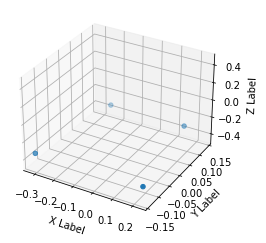


FL before: -0.341. FL after: -0.290009856224

FR before: -0.339. FR after: -0.326881080866

RL before: -0.341. RL after: -0.331072539091

RR before: -0.339. RR after: -0.289956092834
Footstep timestamp:  1628072056.09
Height check index:  725
Height check timestamp:  1628072056.21

FL moving: 0.05099014377600003. FR moving: 0.012118919134000039
RL moving: 0.009927460909000041. RR moving: 0.049043907166000045

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  42
Skipping idx:  42  as flags not valid


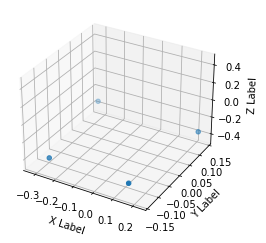


FL before: -0.338. FL after: -0.327310442924

FR before: -0.342. FR after: -0.290425240993

RL before: -0.339. RL after: -0.290922373533

RR before: -0.344. RR after: -0.330255627632
Footstep timestamp:  1628072056.41
Height check index:  741
Height check timestamp:  1628072056.53

FL moving: 0.010689557076. FR moving: 0.05157475900700004
RL moving: 0.048077626467000034. RR moving: 0.013744372367999969

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  43
Skipping idx:  43  as flags not valid


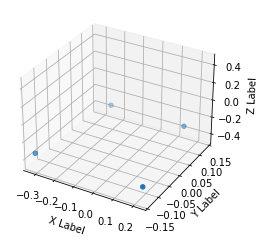


FL before: -0.341. FL after: -0.289305627346

FR before: -0.339. FR after: -0.326559126377

RL before: -0.342. RL after: -0.330435693264

RR before: -0.338. RR after: -0.289029747248
Footstep timestamp:  1628072056.75
Height check index:  758
Height check timestamp:  1628072056.87

FL moving: 0.05169437265400001. FR moving: 0.012440873623000004
RL moving: 0.011564306736000007. RR moving: 0.04897025275200001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  44
Skipping idx:  44  as flags not valid


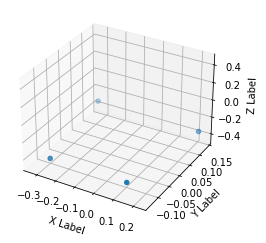


FL before: -0.338. FL after: -0.326866149902

FR before: -0.34. FR after: -0.289303570986

RL before: -0.337. RL after: -0.289309322834

RR before: -0.343. RR after: -0.329064011574
Footstep timestamp:  1628072057.07
Height check index:  774
Height check timestamp:  1628072057.19

FL moving: 0.011133850097999998. FR moving: 0.05069642901400001
RL moving: 0.047690677166000006. RR moving: 0.013935988426000023

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  45
Skipping idx:  45  as flags not valid


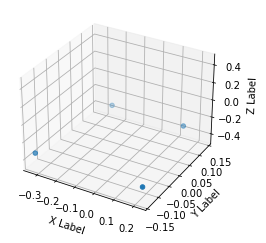


FL before: -0.337. FL after: -0.289438098669

FR before: -0.338. FR after: -0.326438575983

RL before: -0.34. RL after: -0.330682754517

RR before: -0.336. RR after: -0.289839208126
Footstep timestamp:  1628072057.41
Height check index:  791
Height check timestamp:  1628072057.53

FL moving: 0.04756190133100002. FR moving: 0.011561424017
RL moving: 0.009317245483000003. RR moving: 0.04616079187400002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  46
Skipping idx:  46  as flags not valid


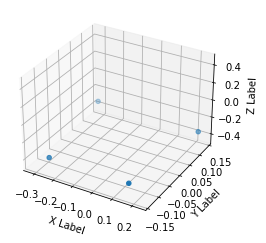


FL before: -0.337. FL after: -0.327579766512

FR before: -0.342. FR after: -0.291018843651

RL before: -0.34. RL after: -0.291718423367

RR before: -0.344. RR after: -0.330285966396
Footstep timestamp:  1628072057.71
Height check index:  806
Height check timestamp:  1628072057.83

FL moving: 0.00942023348800003. FR moving: 0.05098115634900002
RL moving: 0.048281576633000034. RR moving: 0.013714033603999976

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  47
Skipping idx:  47  as flags not valid


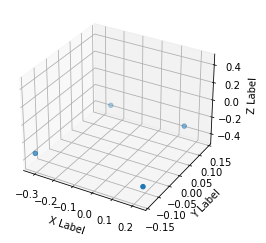


FL before: -0.341. FL after: -0.291058152914

FR before: -0.339. FR after: -0.327407896519

RL before: -0.341. RL after: -0.331662893295

RR before: -0.339. RR after: -0.291161984205
Footstep timestamp:  1628072058.03
Height check index:  822
Height check timestamp:  1628072058.15

FL moving: 0.049941847086000024. FR moving: 0.011592103481000038
RL moving: 0.009337106705000042. RR moving: 0.04783801579500002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  48
Skipping idx:  48  as flags not valid


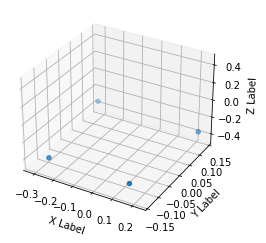


FL before: -0.337. FL after: -0.328253269196

FR before: -0.343. FR after: -0.292983144522

RL before: -0.34. RL after: -0.293312638998

RR before: -0.344. RR after: -0.33132982254
Footstep timestamp:  1628072058.35
Height check index:  838
Height check timestamp:  1628072058.47

FL moving: 0.008746730804000014. FR moving: 0.050016855478
RL moving: 0.04668736100200005. RR moving: 0.012670177459999987

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  49
Skipping idx:  49  as flags not valid


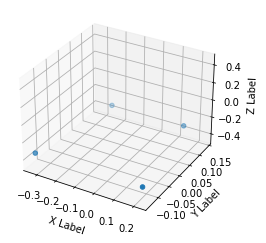


FL before: -0.337. FL after: -0.289252430201

FR before: -0.338. FR after: -0.326064676046

RL before: -0.341. RL after: -0.329601585865

RR before: -0.336. RR after: -0.289451628923
Footstep timestamp:  1628072058.71
Height check index:  856
Height check timestamp:  1628072058.83

FL moving: 0.04774756979900002. FR moving: 0.011935323954000043
RL moving: 0.011398414135000035. RR moving: 0.046548371076999995

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  50
Skipping idx:  50  as flags not valid


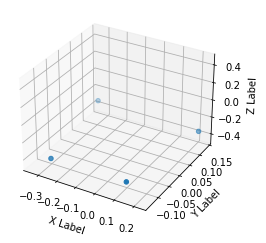


FL before: -0.337. FL after: -0.327173233032

FR before: -0.335. FR after: -0.289825618267

RL before: -0.332. RL after: -0.289814561605

RR before: -0.341. RR after: -0.329700618982
Footstep timestamp:  1628072059.03
Height check index:  872
Height check timestamp:  1628072059.15

FL moving: 0.009826766968. FR moving: 0.045174381733000035
RL moving: 0.042185438395. RR moving: 0.011299381018000043

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  51
Skipping idx:  51  as flags not valid


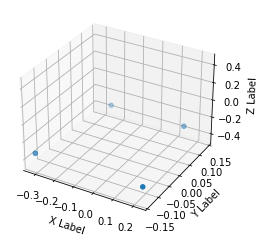


FL before: -0.341. FL after: -0.289333760738

FR before: -0.339. FR after: -0.326609432697

RL before: -0.342. RL after: -0.330574035645

RR before: -0.338. RR after: -0.289071053267
Footstep timestamp:  1628072059.35
Height check index:  888
Height check timestamp:  1628072059.47

FL moving: 0.051666239262000035. FR moving: 0.012390567303000033
RL moving: 0.01142596435500004. RR moving: 0.04892894673300002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  52
Skipping idx:  52  as flags not valid


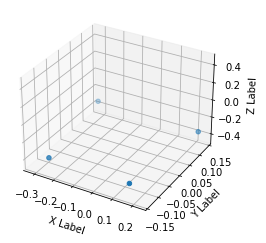


FL before: -0.337. FL after: -0.327115148306

FR before: -0.342. FR after: -0.289860218763

RL before: -0.339. RL after: -0.290414988995

RR before: -0.344. RR after: -0.329708516598
Footstep timestamp:  1628072059.67
Height check index:  904
Height check timestamp:  1628072059.79

FL moving: 0.009884851693999996. FR moving: 0.05213978123700003
RL moving: 0.04858501100500001. RR moving: 0.014291483401999983

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  53
Skipping idx:  53  as flags not valid


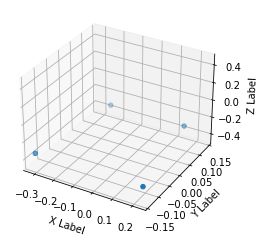


FL before: -0.341. FL after: -0.29076987505

FR before: -0.339. FR after: -0.327069580555

RL before: -0.342. RL after: -0.331524640322

RR before: -0.339. RR after: -0.291054457426
Footstep timestamp:  1628072059.99
Height check index:  920
Height check timestamp:  1628072060.11

FL moving: 0.05023012495000001. FR moving: 0.011930419445000007
RL moving: 0.010475359678000007. RR moving: 0.04794554257400002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  54
Skipping idx:  54  as flags not valid


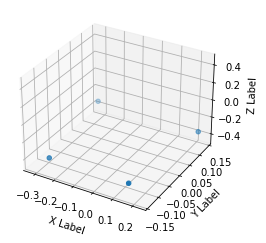


FL before: -0.337. FL after: -0.327448517084

FR before: -0.342. FR after: -0.29106554389

RL before: -0.339. RL after: -0.291723966599

RR before: -0.344. RR after: -0.33020567894
Footstep timestamp:  1628072060.31
Height check index:  936
Height check timestamp:  1628072060.43

FL moving: 0.009551482915999998. FR moving: 0.050934456110000026
RL moving: 0.047276033401000006. RR moving: 0.013794321059999948

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  55
Skipping idx:  55  as flags not valid


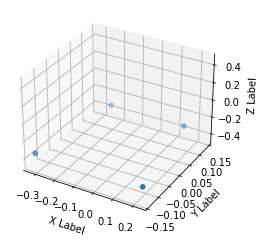


FL before: -0.341. FL after: -0.289409577847

FR before: -0.339. FR after: -0.326520860195

RL before: -0.341. RL after: -0.330564081669

RR before: -0.339. RR after: -0.289740204811
Footstep timestamp:  1628072060.65
Height check index:  953
Height check timestamp:  1628072060.77

FL moving: 0.051590422153000026. FR moving: 0.012479139805000039
RL moving: 0.01043591833100005. RR moving: 0.04925979518900003

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  56
Skipping idx:  56  as flags not valid


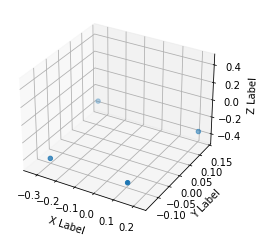


FL before: -0.337. FL after: -0.327115029097

FR before: -0.34. FR after: -0.289727926254

RL before: -0.337. RL after: -0.290017724037

RR before: -0.342. RR after: -0.329280972481
Footstep timestamp:  1628072060.97
Height check index:  969
Height check timestamp:  1628072061.09

FL moving: 0.009884970903000001. FR moving: 0.05027207374600001
RL moving: 0.04698227596300003. RR moving: 0.012719027519000004

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  57
Skipping idx:  57  as flags not valid


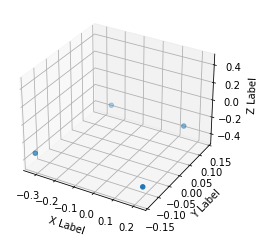


FL before: -0.339. FL after: -0.289217799902

FR before: -0.339. FR after: -0.326600670815

RL before: -0.341. RL after: -0.330571144819

RR before: -0.337. RR after: -0.288917839527
Footstep timestamp:  1628072061.29
Height check index:  985
Height check timestamp:  1628072061.41

FL moving: 0.04978220009800005. FR moving: 0.01239932918500003
RL moving: 0.010428855181000007. RR moving: 0.04808216047300001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  58
Skipping idx:  58  as flags not valid


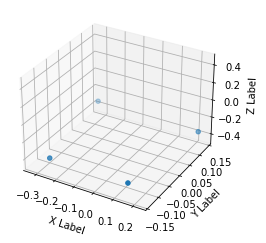


FL before: -0.337. FL after: -0.327106058598

FR before: -0.342. FR after: -0.290019124746

RL before: -0.338. RL after: -0.290723234415

RR before: -0.344. RR after: -0.329553723335
Footstep timestamp:  1628072061.61
Height check index:  1001
Height check timestamp:  1628072061.73

FL moving: 0.009893941402000006. FR moving: 0.051980875254000025
RL moving: 0.04727676558500005. RR moving: 0.01444627666499998

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  59
Skipping idx:  59  as flags not valid


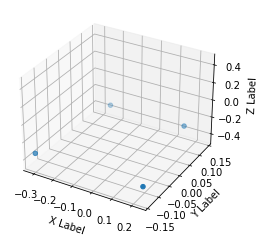


FL before: -0.341. FL after: -0.291443586349

FR before: -0.339. FR after: -0.327319890261

RL before: -0.341. RL after: -0.33182784915

RR before: -0.339. RR after: -0.291784614325
Footstep timestamp:  1628072061.93
Height check index:  1017
Height check timestamp:  1628072062.05

FL moving: 0.04955641365100005. FR moving: 0.011680109739000022
RL moving: 0.009172150850000005. RR moving: 0.047215385675

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  60
Skipping idx:  60  as flags not valid


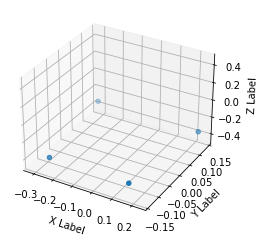


FL before: -0.337. FL after: -0.327779948711

FR before: -0.341. FR after: -0.291551947594

RL before: -0.339. RL after: -0.291898906231

RR before: -0.345. RR after: -0.330399543047
Footstep timestamp:  1628072062.25
Height check index:  1033
Height check timestamp:  1628072062.37

FL moving: 0.009220051288999997. FR moving: 0.04944805240600003
RL moving: 0.04710109376900001. RR moving: 0.014600456952999996

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  61
Skipping idx:  61  as flags not valid


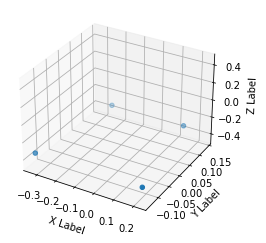


FL before: -0.337. FL after: -0.289115935564

FR before: -0.339. FR after: -0.326413154602

RL before: -0.34. RL after: -0.330265820026

RR before: -0.336. RR after: -0.288894712925
Footstep timestamp:  1628072062.61
Height check index:  1051
Height check timestamp:  1628072062.73

FL moving: 0.04788406443600002. FR moving: 0.012586845398000035
RL moving: 0.009734179974000001. RR moving: 0.047105287075

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  62
Skipping idx:  62  as flags not valid


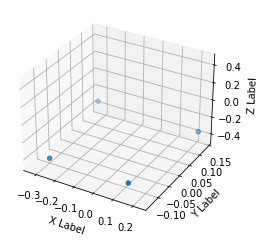


FL before: -0.337. FL after: -0.32674986124

FR before: -0.341. FR after: -0.289040148258

RL before: -0.339. RL after: -0.289186388254

RR before: -0.343. RR after: -0.328495085239
Footstep timestamp:  1628072062.93
Height check index:  1067
Height check timestamp:  1628072063.05

FL moving: 0.010250138760000027. FR moving: 0.05195985174200002
RL moving: 0.04981361174600002. RR moving: 0.01450491476100002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  63
Skipping idx:  63  as flags not valid


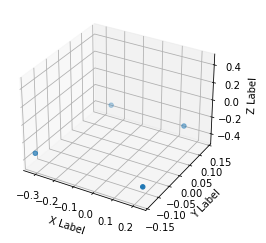


FL before: -0.341. FL after: -0.289590984583

FR before: -0.339. FR after: -0.326702237129

RL before: -0.341. RL after: -0.330868542194

RR before: -0.338. RR after: -0.289301633835
Footstep timestamp:  1628072063.25
Height check index:  1083
Height check timestamp:  1628072063.37

FL moving: 0.05140901541700005. FR moving: 0.01229776287100004
RL moving: 0.010131457806. RR moving: 0.04869836616500001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  64
Skipping idx:  64  as flags not valid


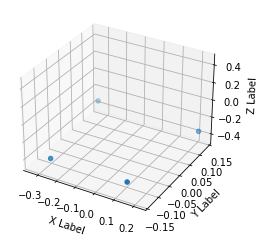


FL before: -0.337. FL after: -0.326438367367

FR before: -0.337. FR after: -0.288987874985

RL before: -0.335. RL after: -0.289728313684

RR before: -0.342. RR after: -0.328612208366
Footstep timestamp:  1628072063.57
Height check index:  1099
Height check timestamp:  1628072063.69

FL moving: 0.010561632633000029. FR moving: 0.04801212501500002
RL moving: 0.04527168631600004. RR moving: 0.013387791634000001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  65
Skipping idx:  65  as flags not valid


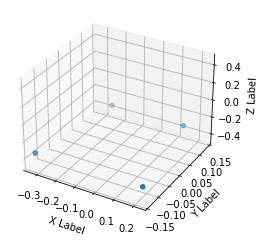


FL before: -0.337. FL after: -0.289076060057

FR before: -0.338. FR after: -0.32618200779

RL before: -0.341. RL after: -0.329812645912

RR before: -0.336. RR after: -0.288752615452
Footstep timestamp:  1628072063.91
Height check index:  1116
Height check timestamp:  1628072064.03

FL moving: 0.04792393994300004. FR moving: 0.011817992210000017
RL moving: 0.011187354088000034. RR moving: 0.04724738454800004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  66
Skipping idx:  66  as flags not valid


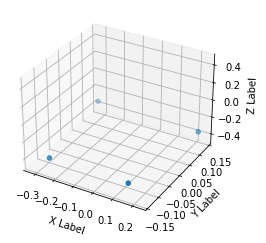


FL before: -0.337. FL after: -0.326783239841

FR before: -0.342. FR after: -0.289263308048

RL before: -0.339. RL after: -0.289984017611

RR before: -0.344. RR after: -0.329027295113
Footstep timestamp:  1628072064.23
Height check index:  1132
Height check timestamp:  1628072064.35

FL moving: 0.010216760159000027. FR moving: 0.05273669195200004
RL moving: 0.04901598238900001. RR moving: 0.014972704886999977

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  67
Skipping idx:  67  as flags not valid


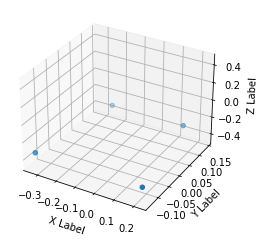


FL before: -0.333. FL after: -0.2888648808

FR before: -0.338. FR after: -0.326236069202

RL before: -0.34. RL after: -0.330118924379

RR before: -0.332. RR after: -0.289223641157
Footstep timestamp:  1628072064.55
Height check index:  1148
Height check timestamp:  1628072064.67

FL moving: 0.04413511920000002. FR moving: 0.011763930798000033
RL moving: 0.009881075621000046. RR moving: 0.04277635884300002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  68
Skipping idx:  68  as flags not valid


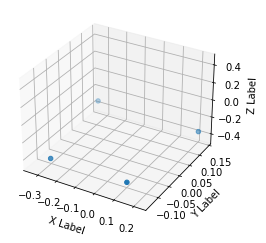


FL before: -0.338. FL after: -0.326621562243

FR before: -0.338. FR after: -0.289116501808

RL before: -0.335. RL after: -0.289133101702

RR before: -0.342. RR after: -0.328599840403
Footstep timestamp:  1628072064.89
Height check index:  1165
Height check timestamp:  1628072065.01

FL moving: 0.011378437757000037. FR moving: 0.048883498192
RL moving: 0.045866898298. RR moving: 0.013400159597000028

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  69
Skipping idx:  69  as flags not valid


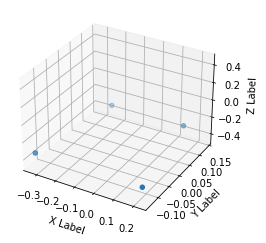


FL before: -0.337. FL after: -0.289070338011

FR before: -0.338. FR after: -0.326352417469

RL before: -0.341. RL after: -0.330358177423

RR before: -0.335. RR after: -0.289386868477
Footstep timestamp:  1628072065.19
Height check index:  1180
Height check timestamp:  1628072065.31

FL moving: 0.047929661989000005. FR moving: 0.011647582531000011
RL moving: 0.010641822577000026. RR moving: 0.045613131523000006

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  70
Skipping idx:  70  as flags not valid


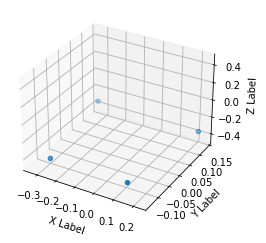


FL before: -0.337. FL after: -0.326764822006

FR before: -0.34. FR after: -0.289238959551

RL before: -0.338. RL after: -0.290031194687

RR before: -0.343. RR after: -0.328912645578
Footstep timestamp:  1628072065.52
Height check index:  1196
Height check timestamp:  1628072065.63

FL moving: 0.010235177994000033. FR moving: 0.05076104044900004
RL moving: 0.04796880531300002. RR moving: 0.014087354422000042

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  71
Skipping idx:  71  as flags not valid


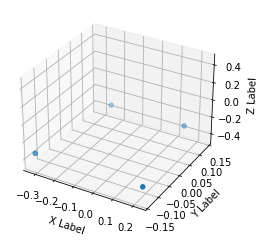


FL before: -0.34. FL after: -0.289323270321

FR before: -0.339. FR after: -0.326471954584

RL before: -0.341. RL after: -0.330663025379

RR before: -0.339. RR after: -0.289527833462
Footstep timestamp:  1628072065.85
Height check index:  1213
Height check timestamp:  1628072065.97

FL moving: 0.050676729679. FR moving: 0.012528045416
RL moving: 0.010336974621000028. RR moving: 0.04947216653800002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  72
Skipping idx:  72  as flags not valid


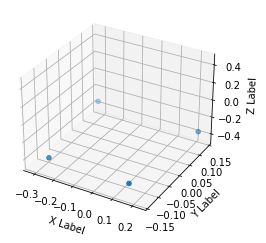


FL before: -0.337. FL after: -0.328495711088

FR before: -0.343. FR after: -0.293329209089

RL before: -0.34. RL after: -0.294038921595

RR before: -0.344. RR after: -0.331837058067
Footstep timestamp:  1628072066.15
Height check index:  1228
Height check timestamp:  1628072066.27

FL moving: 0.008504288912000002. FR moving: 0.04967079091100002
RL moving: 0.04596107840500002. RR moving: 0.012162941932999993

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  73
Skipping idx:  73  as flags not valid


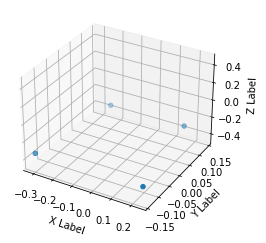


FL before: -0.341. FL after: -0.29941624403

FR before: -0.339. FR after: -0.330853849649

RL before: -0.341. RL after: -0.335023581982

RR before: -0.339. RR after: -0.299633234739
Footstep timestamp:  1628072066.47
Height check index:  1243
Height check timestamp:  1628072066.58

FL moving: 0.041583755970000025. FR moving: 0.008146150351000025
RL moving: 0.005976418018000029. RR moving: 0.039366765261000025

FL moving: True. FR moving: False
RL moving: False. RR moving: True
idx:  74

Coord FL: [0.151, 0.139, -0.341]. Coord FR: [0.232, -0.135, -0.339]. Coord RL: [-0.243, 0.138, -0.341]. Coord RR: [-0.315, -0.138, -0.339]

FR step_size x: 0.146539777279. FR step_size y: 0.011072925567999992. RL step_size x: 0.143177825331. RL step_size x: 0.0022720018620000226.


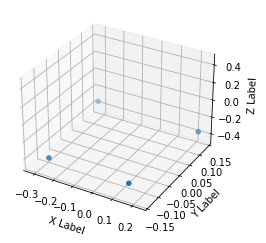


FL before: -0.337. FL after: -0.326733112335

FR before: -0.342. FR after: -0.289248436689

RL before: -0.34. RL after: -0.290053367615

RR before: -0.345. RR after: -0.328991353512
Footstep timestamp:  1628072066.82
Height check index:  1261
Height check timestamp:  1628072066.93

FL moving: 0.010266887665000002. FR moving: 0.052751563311000005
RL moving: 0.04994663238500002. RR moving: 0.01600864648799999

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  75
Skipping idx:  75  as flags not valid


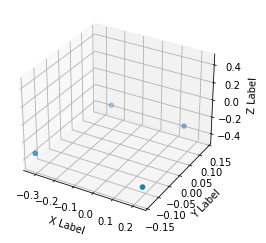


FL before: -0.341. FL after: -0.289610654116

FR before: -0.339. FR after: -0.326727837324

RL before: -0.341. RL after: -0.330790579319

RR before: -0.339. RR after: -0.289627432823
Footstep timestamp:  1628072067.16
Height check index:  1278
Height check timestamp:  1628072067.27

FL moving: 0.051389345884000015. FR moving: 0.012272162676000009
RL moving: 0.010209420681000003. RR moving: 0.049372567177000004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  76
Skipping idx:  76  as flags not valid


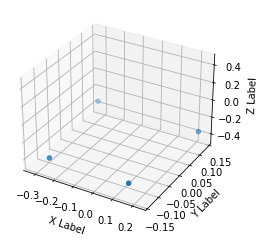


FL before: -0.337. FL after: -0.327119886875

FR before: -0.342. FR after: -0.289884537458

RL before: -0.339. RL after: -0.290747851133

RR before: -0.344. RR after: -0.329493403435
Footstep timestamp:  1628072067.48
Height check index:  1294
Height check timestamp:  1628072067.6

FL moving: 0.009880113125000034. FR moving: 0.052115462542
RL moving: 0.04825214886700002. RR moving: 0.014506596564999974

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  77
Skipping idx:  77  as flags not valid


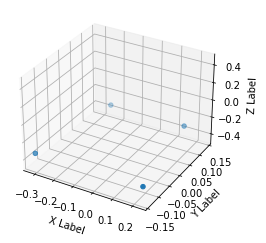


FL before: -0.341. FL after: -0.290017426014

FR before: -0.339. FR after: -0.326951444149

RL before: -0.341. RL after: -0.331221520901

RR before: -0.339. RR after: -0.28996232152
Footstep timestamp:  1628072067.8
Height check index:  1310
Height check timestamp:  1628072067.92

FL moving: 0.050982573986000035. FR moving: 0.012048555851000009
RL moving: 0.009778479099000037. RR moving: 0.04903767848000001

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  78
Skipping idx:  78  as flags not valid


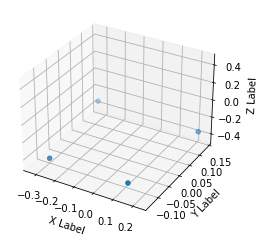


FL before: -0.337. FL after: -0.327412515879

FR before: -0.342. FR after: -0.29064142704

RL before: -0.338. RL after: -0.291820943356

RR before: -0.343. RR after: -0.330221027136
Footstep timestamp:  1628072068.12
Height check index:  1326
Height check timestamp:  1628072068.24

FL moving: 0.009587484121000023. FR moving: 0.051358572960000015
RL moving: 0.046179056644000016. RR moving: 0.012778972864000038

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  79
Skipping idx:  79  as flags not valid


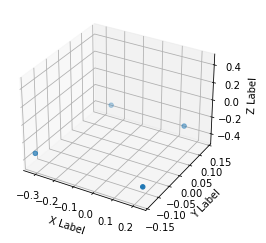


FL before: -0.341. FL after: -0.291688919067

FR before: -0.339. FR after: -0.327685028315

RL before: -0.341. RL after: -0.332002550364

RR before: -0.339. RR after: -0.291652292013
Footstep timestamp:  1628072068.44
Height check index:  1342
Height check timestamp:  1628072068.56

FL moving: 0.04931108093300002. FR moving: 0.011314971685000008
RL moving: 0.008997449636000021. RR moving: 0.047347707987

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  80
Skipping idx:  80  as flags not valid


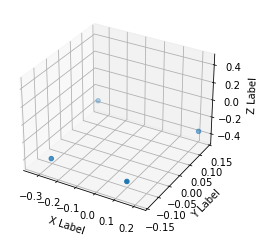


FL before: -0.337. FL after: -0.326383084059

FR before: -0.335. FR after: -0.29033651948

RL before: -0.333. RL after: -0.290961265564

RR before: -0.341. RR after: -0.327850997448
Footstep timestamp:  1628072068.8
Height check index:  1360
Height check timestamp:  1628072068.92

FL moving: 0.010616915941000005. FR moving: 0.04466348052000002
RL moving: 0.042038734436000036. RR moving: 0.013149002552000022

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  81
Skipping idx:  81  as flags not valid


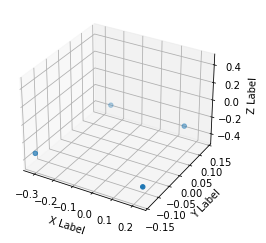


FL before: -0.341. FL after: -0.295235693455

FR before: -0.339. FR after: -0.328992068768

RL before: -0.342. RL after: -0.333612710238

RR before: -0.339. RR after: -0.295513540506
Footstep timestamp:  1628072069.08
Height check index:  1374
Height check timestamp:  1628072069.2

FL moving: 0.04576430654500002. FR moving: 0.010007931232
RL moving: 0.008387289762000039. RR moving: 0.04348645949400004

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  82
Skipping idx:  82  as flags not valid


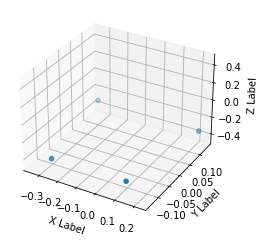


FL before: -0.336. FL after: -0.326639533043

FR before: -0.332. FR after: -0.289362579584

RL before: -0.329. RL after: -0.290001064539

RR before: -0.341. RR after: -0.327792435884
Footstep timestamp:  1628072069.44
Height check index:  1392
Height check timestamp:  1628072069.56

FL moving: 0.009360466957000046. FR moving: 0.042637420415999994
RL moving: 0.03899893546100003. RR moving: 0.013207564116000048

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  83
Skipping idx:  83  as flags not valid


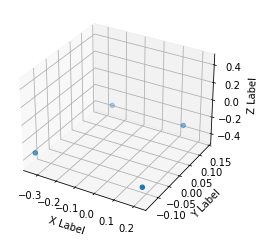


FL before: -0.334. FL after: -0.288918018341

FR before: -0.338. FR after: -0.326053500175

RL before: -0.34. RL after: -0.329973042011

RR before: -0.333. RR after: -0.289267987013
Footstep timestamp:  1628072069.78
Height check index:  1409
Height check timestamp:  1628072069.9

FL moving: 0.045081981659000014. FR moving: 0.011946499825000012
RL moving: 0.010026957989000052. RR moving: 0.043732012987000024

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  84
Skipping idx:  84  as flags not valid


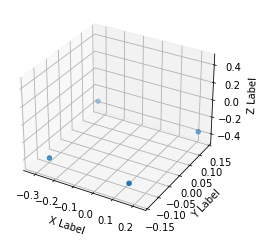


FL before: -0.337. FL after: -0.326665282249

FR before: -0.342. FR after: -0.289307385683

RL before: -0.339. RL after: -0.290026426315

RR before: -0.344. RR after: -0.327842116356
Footstep timestamp:  1628072070.1
Height check index:  1425
Height check timestamp:  1628072070.22

FL moving: 0.010334717751000033. FR moving: 0.05269261431700001
RL moving: 0.04897357368500005. RR moving: 0.01615788364399995

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  85
Skipping idx:  85  as flags not valid


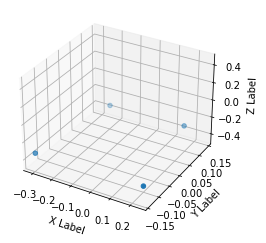


FL before: -0.339. FL after: -0.292893260717

FR before: -0.338. FR after: -0.327987492085

RL before: -0.34. RL after: -0.332371860743

RR before: -0.337. RR after: -0.293161571026
Footstep timestamp:  1628072070.38
Height check index:  1439
Height check timestamp:  1628072070.5

FL moving: 0.04610673928300002. FR moving: 0.010012507915000024
RL moving: 0.007628139257000011. RR moving: 0.04383842897400003

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  86
Skipping idx:  86  as flags not valid


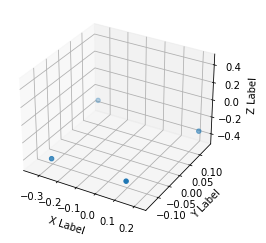


FL before: -0.337. FL after: -0.327073782682

FR before: -0.331. FR after: -0.289514839649

RL before: -0.328. RL after: -0.289539933205

RR before: -0.341. RR after: -0.329208880663
Footstep timestamp:  1628072070.74
Height check index:  1457
Height check timestamp:  1628072070.86

FL moving: 0.00992621731800003. FR moving: 0.04148516035100003
RL moving: 0.038460066795000025. RR moving: 0.011791119337

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  87
Skipping idx:  87  as flags not valid


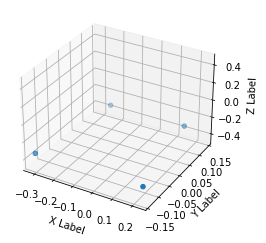


FL before: -0.341. FL after: -0.288948714733

FR before: -0.339. FR after: -0.326294571161

RL before: -0.341. RL after: -0.33065199852

RR before: -0.339. RR after: -0.289216071367
Footstep timestamp:  1628072071.06
Height check index:  1473
Height check timestamp:  1628072071.18

FL moving: 0.052051285267000036. FR moving: 0.012705428839
RL moving: 0.010348001480000035. RR moving: 0.04978392863300002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  88
Skipping idx:  88  as flags not valid


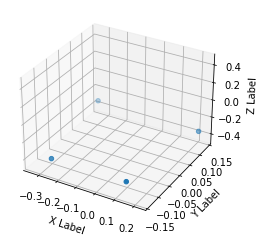


FL before: -0.337. FL after: -0.32691976428

FR before: -0.336. FR after: -0.289320021868

RL before: -0.333. RL after: -0.290001958609

RR before: -0.341. RR after: -0.328970402479
Footstep timestamp:  1628072071.4
Height check index:  1490
Height check timestamp:  1628072071.52

FL moving: 0.010080235719999997. FR moving: 0.04667997813200003
RL moving: 0.042998041391. RR moving: 0.012029597521000024

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  89
Skipping idx:  89  as flags not valid


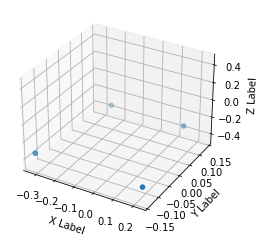


FL before: -0.339. FL after: -0.289092212915

FR before: -0.339. FR after: -0.326290398836

RL before: -0.341. RL after: -0.330630689859

RR before: -0.338. RR after: -0.28942194581
Footstep timestamp:  1628072071.72
Height check index:  1506
Height check timestamp:  1628072071.84

FL moving: 0.049907787085000044. FR moving: 0.01270960116400005
RL moving: 0.01036931014100001. RR moving: 0.04857805419

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  90
Skipping idx:  90  as flags not valid


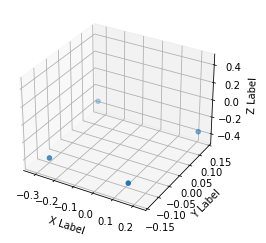


FL before: -0.337. FL after: -0.327176332474

FR before: -0.342. FR after: -0.289660006762

RL before: -0.339. RL after: -0.291028529406

RR before: -0.344. RR after: -0.329340428114
Footstep timestamp:  1628072072.04
Height check index:  1522
Height check timestamp:  1628072072.16

FL moving: 0.009823667526000002. FR moving: 0.05233999323800004
RL moving: 0.04797147059400003. RR moving: 0.014659571885999978

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  91
Skipping idx:  91  as flags not valid


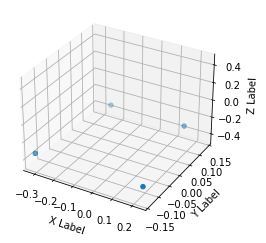


FL before: -0.341. FL after: -0.290033072233

FR before: -0.339. FR after: -0.326935470104

RL before: -0.341. RL after: -0.331143289804

RR before: -0.339. RR after: -0.290072500706
Footstep timestamp:  1628072072.36
Height check index:  1538
Height check timestamp:  1628072072.48

FL moving: 0.050966927767000014. FR moving: 0.012064529896000042
RL moving: 0.00985671019600004. RR moving: 0.04892749929400003

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  92
Skipping idx:  92  as flags not valid


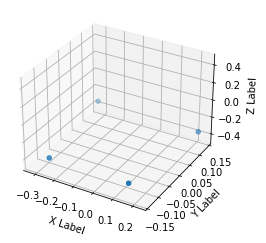


FL before: -0.337. FL after: -0.327227652073

FR before: -0.342. FR after: -0.290485739708

RL before: -0.339. RL after: -0.291198611259

RR before: -0.344. RR after: -0.330102711916
Footstep timestamp:  1628072072.68
Height check index:  1554
Height check timestamp:  1628072072.8

FL moving: 0.009772347927000047. FR moving: 0.051514260292000014
RL moving: 0.04780138874100004. RR moving: 0.013897288083999981

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  93
Skipping idx:  93  as flags not valid


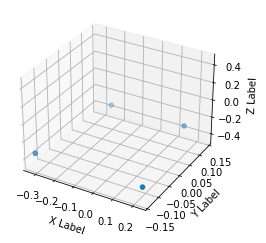


FL before: -0.34. FL after: -0.290067642927

FR before: -0.339. FR after: -0.326903641224

RL before: -0.341. RL after: -0.331102520227

RR before: -0.339. RR after: -0.290053546429
Footstep timestamp:  1628072073.0
Height check index:  1570
Height check timestamp:  1628072073.12

FL moving: 0.04993235707300003. FR moving: 0.012096358776000016
RL moving: 0.00989747977300004. RR moving: 0.048946453571000026

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  94
Skipping idx:  94  as flags not valid


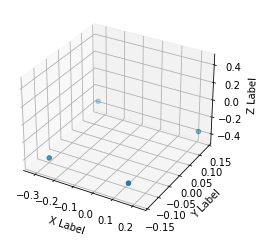


FL before: -0.337. FL after: -0.328445255756

FR before: -0.342. FR after: -0.293641418219

RL before: -0.339. RL after: -0.293860048056

RR before: -0.344. RR after: -0.332054018974
Footstep timestamp:  1628072073.32
Height check index:  1586
Height check timestamp:  1628072073.44

FL moving: 0.008554744244000045. FR moving: 0.048358581781
RL moving: 0.045139951944. RR moving: 0.011945981025999974

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  95
Skipping idx:  95  as flags not valid


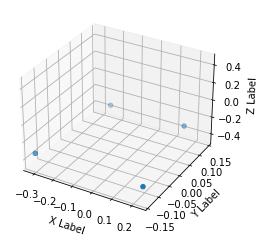


FL before: -0.341. FL after: -0.290253698826

FR before: -0.339. FR after: -0.32693567872

RL before: -0.341. RL after: -0.331132799387

RR before: -0.339. RR after: -0.290698707104
Footstep timestamp:  1628072073.64
Height check index:  1602
Height check timestamp:  1628072073.76

FL moving: 0.05074630117400003. FR moving: 0.012064321280000012
RL moving: 0.009867200613000005. RR moving: 0.04830129289600005

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  96
Skipping idx:  96  as flags not valid


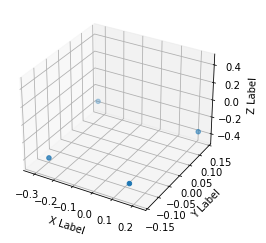


FL before: -0.337. FL after: -0.32741317153

FR before: -0.343. FR after: -0.290960013866

RL before: -0.34. RL after: -0.291692137718

RR before: -0.345. RR after: -0.330129176378
Footstep timestamp:  1628072073.98
Height check index:  1619
Height check timestamp:  1628072074.1

FL moving: 0.00958682847000003. FR moving: 0.052039986134000016
RL moving: 0.048307862282000014. RR moving: 0.014870823621999985

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  97
Skipping idx:  97  as flags not valid


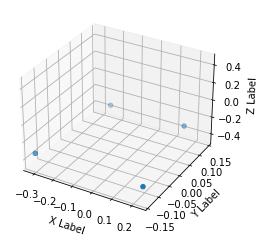


FL before: -0.341. FL after: -0.291190266609

FR before: -0.339. FR after: -0.327448159456

RL before: -0.341. RL after: -0.331728577614

RR before: -0.339. RR after: -0.291144579649
Footstep timestamp:  1628072074.3
Height check index:  1635
Height check timestamp:  1628072074.42

FL moving: 0.04980973339100003. FR moving: 0.011551840544000047
RL moving: 0.009271422386000039. RR moving: 0.047855420351000044

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  98
Skipping idx:  98  as flags not valid


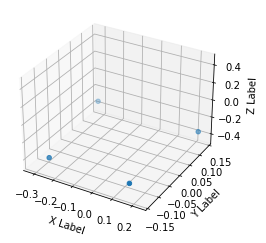


FL before: -0.337. FL after: -0.327048480511

FR before: -0.341. FR after: -0.289854377508

RL before: -0.339. RL after: -0.290643066168

RR before: -0.345. RR after: -0.329564899206
Footstep timestamp:  1628072074.62
Height check index:  1651
Height check timestamp:  1628072074.74

FL moving: 0.009951519489000027. FR moving: 0.051145622492
RL moving: 0.048356933832000015. RR moving: 0.015435100793999956

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  99
Skipping idx:  99  as flags not valid


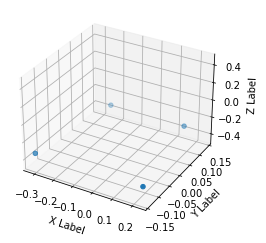


FL before: -0.342. FL after: -0.290359139442

FR before: -0.339. FR after: -0.326859861612

RL before: -0.342. RL after: -0.331241875887

RR before: -0.339. RR after: -0.290598273277
Footstep timestamp:  1628072074.96
Height check index:  1668
Height check timestamp:  1628072075.08

FL moving: 0.051640860558000046. FR moving: 0.012140138388000044
RL moving: 0.010758124113000034. RR moving: 0.04840172672300003

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  100
Skipping idx:  100  as flags not valid


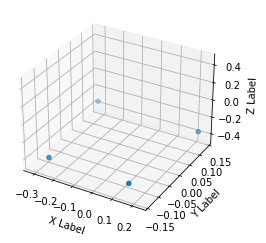


FL before: -0.337. FL after: -0.326724976301

FR before: -0.343. FR after: -0.289256513119

RL before: -0.34. RL after: -0.28982681036

RR before: -0.344. RR after: -0.329117506742
Footstep timestamp:  1628072075.28
Height check index:  1684
Height check timestamp:  1628072075.4

FL moving: 0.010275023699000019. FR moving: 0.053743486881
RL moving: 0.050173189640000004. RR moving: 0.014882493257999951

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  101
Skipping idx:  101  as flags not valid


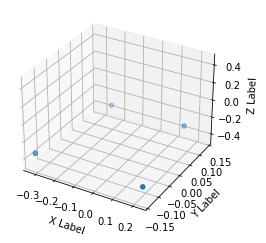


FL before: -0.34. FL after: -0.289343386889

FR before: -0.339. FR after: -0.32643610239

RL before: -0.341. RL after: -0.330751210451

RR before: -0.339. RR after: -0.289817541838
Footstep timestamp:  1628072075.62
Height check index:  1701
Height check timestamp:  1628072075.74

FL moving: 0.050656613111000004. FR moving: 0.012563897610000041
RL moving: 0.010248789549000048. RR moving: 0.04918245816200001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  102
Skipping idx:  102  as flags not valid


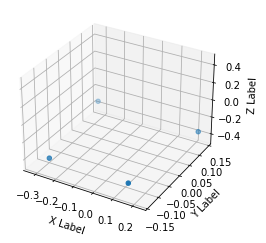


FL before: -0.337. FL after: -0.328437238932

FR before: -0.342. FR after: -0.293560564518

RL before: -0.339. RL after: -0.294085323811

RR before: -0.343. RR after: -0.331893354654
Footstep timestamp:  1628072075.92
Height check index:  1716
Height check timestamp:  1628072076.04

FL moving: 0.008562761068000024. FR moving: 0.048439435482000026
RL moving: 0.044914676189000025. RR moving: 0.011106645346000033

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  103
Skipping idx:  103  as flags not valid


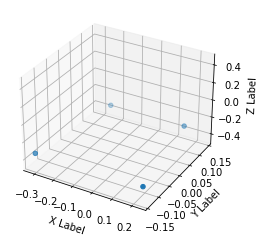


FL before: -0.341. FL after: -0.289942204952

FR before: -0.339. FR after: -0.326866716146

RL before: -0.341. RL after: -0.331219315529

RR before: -0.339. RR after: -0.290025919676
Footstep timestamp:  1628072076.26
Height check index:  1733
Height check timestamp:  1628072076.38

FL moving: 0.05105779504800001. FR moving: 0.012133283854000032
RL moving: 0.009780684471. RR moving: 0.048974080324000024

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  104
Skipping idx:  104  as flags not valid


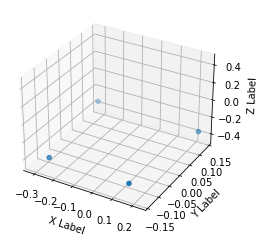


FL before: -0.337. FL after: -0.328428804874

FR before: -0.343. FR after: -0.293429791927

RL before: -0.34. RL after: -0.293526113033

RR before: -0.344. RR after: -0.331794410944
Footstep timestamp:  1628072076.56
Height check index:  1748
Height check timestamp:  1628072076.68

FL moving: 0.00857119512600002. FR moving: 0.049570208073
RL moving: 0.046473886967. RR moving: 0.012205589055999999

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  105
Skipping idx:  105  as flags not valid


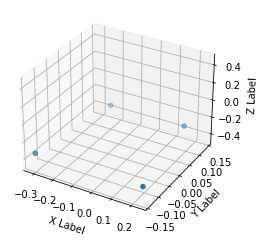


FL before: -0.341. FL after: -0.291054219007

FR before: -0.339. FR after: -0.327442824841

RL before: -0.341. RL after: -0.33177909255

RR before: -0.339. RR after: -0.291156232357
Footstep timestamp:  1628072076.9
Height check index:  1765
Height check timestamp:  1628072077.02

FL moving: 0.04994578099300001. FR moving: 0.01155717515900001
RL moving: 0.009220907450000038. RR moving: 0.047843767643000024

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  106
Skipping idx:  106  as flags not valid


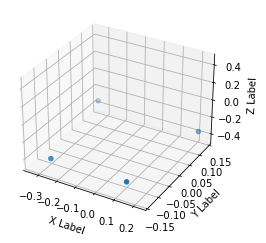


FL before: -0.338. FL after: -0.326599955559

FR before: -0.337. FR after: -0.289090394974

RL before: -0.334. RL after: -0.289871096611

RR before: -0.342. RR after: -0.328443795443
Footstep timestamp:  1628072077.26
Height check index:  1783
Height check timestamp:  1628072077.38

FL moving: 0.011400044441000012. FR moving: 0.047909605026
RL moving: 0.044128903388999996. RR moving: 0.013556204557000018

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  107
Skipping idx:  107  as flags not valid


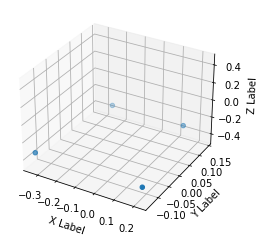


FL before: -0.333. FL after: -0.288863867521

FR before: -0.338. FR after: -0.326109886169

RL before: -0.34. RL after: -0.330383688211

RR before: -0.332. RR after: -0.289275556803
Footstep timestamp:  1628072077.58
Height check index:  1799
Height check timestamp:  1628072077.71

FL moving: 0.044136132479. FR moving: 0.011890113831000027
RL moving: 0.00961631178900002. RR moving: 0.04272444319700003

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  108
Skipping idx:  108  as flags not valid


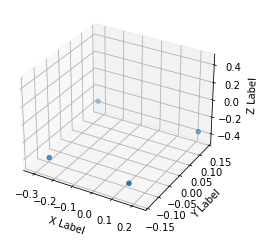


FL before: -0.337. FL after: -0.328802257776

FR before: -0.341. FR after: -0.293903201818

RL before: -0.339. RL after: -0.294054836035

RR before: -0.344. RR after: -0.332245200872
Footstep timestamp:  1628072077.86
Height check index:  1813
Height check timestamp:  1628072077.98

FL moving: 0.008197742224000049. FR moving: 0.04709679818200002
RL moving: 0.044945163965000035. RR moving: 0.011754799127999982

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  109
Skipping idx:  109  as flags not valid


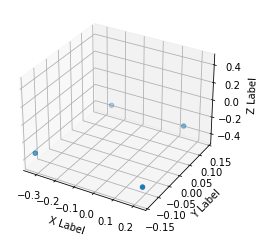


FL before: -0.339. FL after: -0.289106637239

FR before: -0.339. FR after: -0.32599812746

RL before: -0.341. RL after: -0.329749375582

RR before: -0.337. RR after: -0.289315491915
Footstep timestamp:  1628072078.23
Height check index:  1831
Height check timestamp:  1628072078.34

FL moving: 0.04989336276100004. FR moving: 0.013001872540000015
RL moving: 0.01125062441800001. RR moving: 0.04768450808500002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  110
Skipping idx:  110  as flags not valid


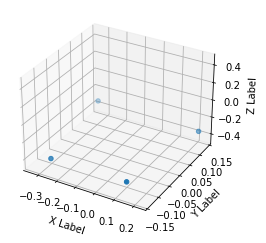


FL before: -0.337. FL after: -0.326478004456

FR before: -0.337. FR after: -0.289145320654

RL before: -0.335. RL after: -0.289936900139

RR before: -0.342. RR after: -0.328478455544
Footstep timestamp:  1628072078.57
Height check index:  1848
Height check timestamp:  1628072078.69

FL moving: 0.010521995544000018. FR moving: 0.04785467934600002
RL moving: 0.045063099861000044. RR moving: 0.013521544456000012

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  111
Skipping idx:  111  as flags not valid


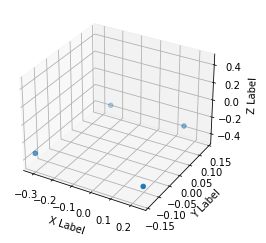


FL before: -0.341. FL after: -0.294856876135

FR before: -0.339. FR after: -0.328995466232

RL before: -0.341. RL after: -0.333641171455

RR before: -0.338. RR after: -0.295193016529
Footstep timestamp:  1628072078.85
Height check index:  1862
Height check timestamp:  1628072078.96

FL moving: 0.046143123865000024. FR moving: 0.010004533768000035
RL moving: 0.007358828545000029. RR moving: 0.04280698347100004

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  112
Skipping idx:  112  as flags not valid


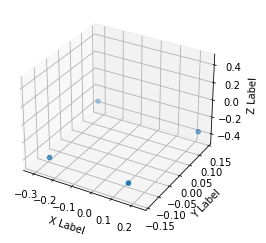


FL before: -0.337. FL after: -0.328289061785

FR before: -0.341. FR after: -0.293587833643

RL before: -0.339. RL after: -0.294081151485

RR before: -0.345. RR after: -0.331996530294
Footstep timestamp:  1628072079.17
Height check index:  1878
Height check timestamp:  1628072079.29

FL moving: 0.00871093821500002. FR moving: 0.04741216635700002
RL moving: 0.044918848515. RR moving: 0.01300346970599997

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  113
Skipping idx:  113  as flags not valid


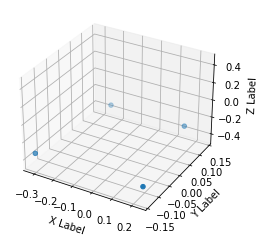


FL before: -0.341. FL after: -0.291446179152

FR before: -0.339. FR after: -0.327328562737

RL before: -0.341. RL after: -0.33178755641

RR before: -0.339. RR after: -0.291852325201
Footstep timestamp:  1628072079.51
Height check index:  1895
Height check timestamp:  1628072079.63

FL moving: 0.04955382084800003. FR moving: 0.011671437263000017
RL moving: 0.009212443590000008. RR moving: 0.047147674799000006

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  114
Skipping idx:  114  as flags not valid


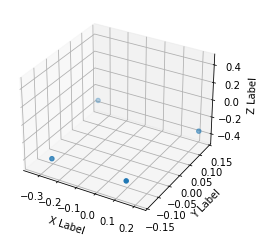


FL before: -0.337. FL after: -0.326555490494

FR before: -0.331. FR after: -0.288979530334

RL before: -0.329. RL after: -0.289902299643

RR before: -0.34. RR after: -0.328394055367
Footstep timestamp:  1628072079.87
Height check index:  1913
Height check timestamp:  1628072079.99

FL moving: 0.01044450950600001. FR moving: 0.04202046966600004
RL moving: 0.039097700357. RR moving: 0.01160594463300002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  115
Skipping idx:  115  as flags not valid


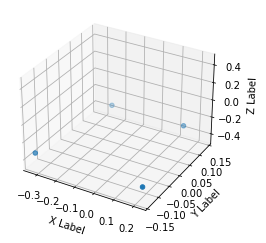


FL before: -0.337. FL after: -0.288963377476

FR before: -0.338. FR after: -0.326207667589

RL before: -0.34. RL after: -0.330176502466

RR before: -0.335. RR after: -0.289199262857
Footstep timestamp:  1628072080.19
Height check index:  1929
Height check timestamp:  1628072080.31

FL moving: 0.04803662252400004. FR moving: 0.011792332411000028
RL moving: 0.009823497534000025. RR moving: 0.045800737143000037

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  116
Skipping idx:  116  as flags not valid


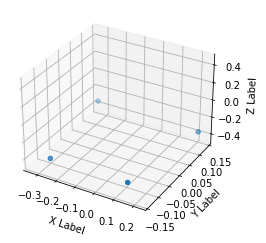


FL before: -0.338. FL after: -0.326871156693

FR before: -0.34. FR after: -0.289218515158

RL before: -0.337. RL after: -0.289428591728

RR before: -0.343. RR after: -0.328736245632
Footstep timestamp:  1628072080.51
Height check index:  1945
Height check timestamp:  1628072080.63

FL moving: 0.011128843307000036. FR moving: 0.05078148484200001
RL moving: 0.047571408272000015. RR moving: 0.014263754368000037

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  117
Skipping idx:  117  as flags not valid


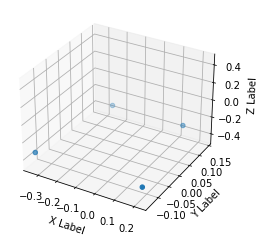


FL before: -0.33. FL after: -0.289036989212

FR before: -0.337. FR after: -0.326285332441

RL before: -0.34. RL after: -0.330510795116

RR before: -0.329. RR after: -0.2893255651
Footstep timestamp:  1628072080.83
Height check index:  1961
Height check timestamp:  1628072080.95

FL moving: 0.04096301078800002. FR moving: 0.010714667559000024
RL moving: 0.009489204884000013. RR moving: 0.0396744349

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  118
Skipping idx:  118  as flags not valid


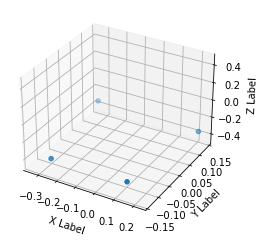


FL before: -0.337. FL after: -0.326528400183

FR before: -0.338. FR after: -0.288874953985

RL before: -0.335. RL after: -0.28987377882

RR before: -0.342. RR after: -0.328661620617
Footstep timestamp:  1628072081.15
Height check index:  1977
Height check timestamp:  1628072081.27

FL moving: 0.010471599817000021. FR moving: 0.04912504601500001
RL moving: 0.04512622118000004. RR moving: 0.013338379383000032

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  119
Skipping idx:  119  as flags not valid


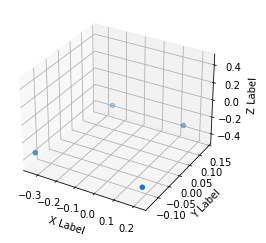


FL before: -0.333. FL after: -0.288813829422

FR before: -0.338. FR after: -0.326146364212

RL before: -0.34. RL after: -0.330267906189

RR before: -0.332. RR after: -0.289004594088
Footstep timestamp:  1628072081.49
Height check index:  1994
Height check timestamp:  1628072081.61

FL moving: 0.044186170578000006. FR moving: 0.011853635788000028
RL moving: 0.009732093811000042. RR moving: 0.04299540591200002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  120
Skipping idx:  120  as flags not valid


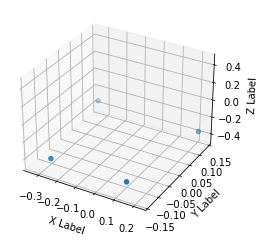


FL before: -0.337. FL after: -0.326684743166

FR before: -0.337. FR after: -0.288771688938

RL before: -0.334. RL after: -0.290501505136

RR before: -0.342. RR after: -0.328984022141
Footstep timestamp:  1628072081.81
Height check index:  2010
Height check timestamp:  1628072081.93

FL moving: 0.01031525683400003. FR moving: 0.04822831106200004
RL moving: 0.04349849486400004. RR moving: 0.01301597785900005

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  121
Skipping idx:  121  as flags not valid


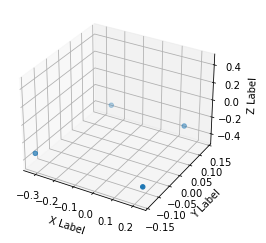


FL before: -0.34. FL after: -0.28973403573

FR before: -0.339. FR after: -0.326638817787

RL before: -0.341. RL after: -0.331057876348

RR before: -0.339. RR after: -0.29016494751
Footstep timestamp:  1628072082.11
Height check index:  2025
Height check timestamp:  1628072082.23

FL moving: 0.05026596427000002. FR moving: 0.012361182213000033
RL moving: 0.009942123652000034. RR moving: 0.04883505249000003

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  122
Skipping idx:  122  as flags not valid


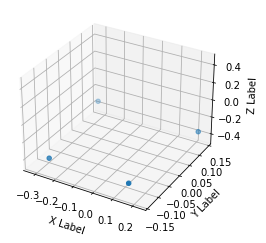


FL before: -0.337. FL after: -0.326951116323

FR before: -0.342. FR after: -0.289200305939

RL before: -0.339. RL after: -0.289775520563

RR before: -0.344. RR after: -0.328993707895
Footstep timestamp:  1628072082.45
Height check index:  2042
Height check timestamp:  1628072082.57

FL moving: 0.01004888367700002. FR moving: 0.052799694061000046
RL moving: 0.049224479437000035. RR moving: 0.015006292104999985

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  123
Skipping idx:  123  as flags not valid


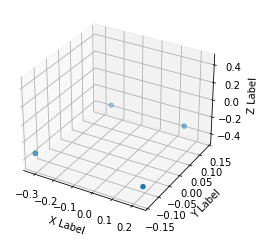


FL before: -0.341. FL after: -0.289705067873

FR before: -0.339. FR after: -0.326622188091

RL before: -0.341. RL after: -0.331033140421

RR before: -0.339. RR after: -0.290184289217
Footstep timestamp:  1628072082.77
Height check index:  2058
Height check timestamp:  1628072082.89

FL moving: 0.05129493212700004. FR moving: 0.012377811909000003
RL moving: 0.00996685957900001. RR moving: 0.04881571078300001

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  124
Skipping idx:  124  as flags not valid


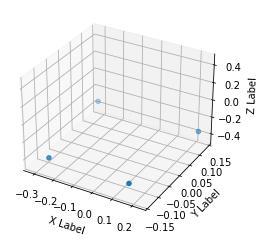


FL before: -0.337. FL after: -0.327268987894

FR before: -0.343. FR after: -0.290283530951

RL before: -0.34. RL after: -0.290584266186

RR before: -0.344. RR after: -0.329881995916
Footstep timestamp:  1628072083.09
Height check index:  2074
Height check timestamp:  1628072083.21

FL moving: 0.009731012106000025. FR moving: 0.052716469049000014
RL moving: 0.04941573381400005. RR moving: 0.014118004083999991

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  125
Skipping idx:  125  as flags not valid


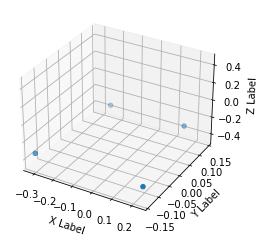


FL before: -0.341. FL after: -0.291027605534

FR before: -0.339. FR after: -0.327509641647

RL before: -0.341. RL after: -0.331704854965

RR before: -0.339. RR after: -0.291107386351
Footstep timestamp:  1628072083.41
Height check index:  2090
Height check timestamp:  1628072083.53

FL moving: 0.04997239446600005. FR moving: 0.011490358352999996
RL moving: 0.009295145035000008. RR moving: 0.04789261364900005

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  126
Skipping idx:  126  as flags not valid


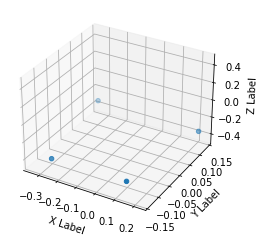


FL before: -0.337. FL after: -0.326629340649

FR before: -0.335. FR after: -0.28898525238

RL before: -0.332. RL after: -0.28986877203

RR before: -0.341. RR after: -0.328197538853
Footstep timestamp:  1628072083.77
Height check index:  2108
Height check timestamp:  1628072083.89

FL moving: 0.010370659351000011. FR moving: 0.04601474762000002
RL moving: 0.04213122797000002. RR moving: 0.01280246114700001

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  127
Skipping idx:  127  as flags not valid


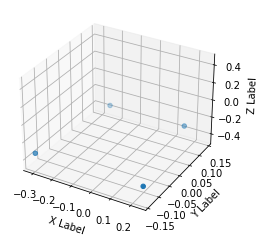


FL before: -0.34. FL after: -0.292398035526

FR before: -0.338. FR after: -0.328013151884

RL before: -0.34. RL after: -0.332484155893

RR before: -0.338. RR after: -0.29241040349
Footstep timestamp:  1628072084.05
Height check index:  2122
Height check timestamp:  1628072084.17

FL moving: 0.047601964474. FR moving: 0.009986848116000036
RL moving: 0.007515844107000014. RR moving: 0.04558959651

FL moving: True. FR moving: False
RL moving: False. RR moving: True
idx:  128

Coord FL: [0.154, 0.14, -0.34]. Coord FR: [0.234, -0.135, -0.338]. Coord RL: [-0.241, 0.137, -0.34]. Coord RR: [-0.311, -0.139, -0.338]

FR step_size x: 0.148062961101. FR step_size y: 0.013897453546. RL step_size x: 0.140808678865. RL step_size x: 0.005696262837000005.


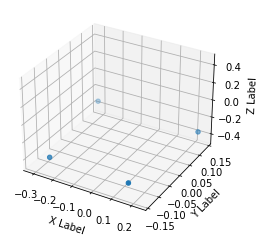


FL before: -0.337. FL after: -0.328532218933

FR before: -0.34. FR after: -0.293396323919

RL before: -0.338. RL after: -0.293371856213

RR before: -0.345. RR after: -0.33177319169
Footstep timestamp:  1628072084.37
Height check index:  2138
Height check timestamp:  1628072084.49

FL moving: 0.008467781067000024. FR moving: 0.04660367608100002
RL moving: 0.04462814378700003. RR moving: 0.013226808309999949

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  129
Skipping idx:  129  as flags not valid


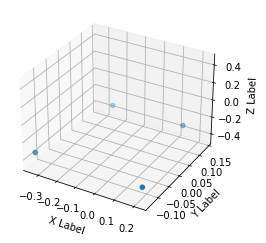


FL before: -0.33. FL after: -0.288749396801

FR before: -0.338. FR after: -0.326026529074

RL before: -0.339. RL after: -0.3300768435

RR before: -0.329. RR after: -0.289159178734
Footstep timestamp:  1628072084.75
Height check index:  2157
Height check timestamp:  1628072084.87

FL moving: 0.041250603199000035. FR moving: 0.01197347092600004
RL moving: 0.008923156500000029. RR moving: 0.039840821266000026

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  130
Skipping idx:  130  as flags not valid


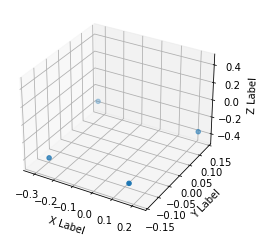


FL before: -0.337. FL after: -0.328099280596

FR before: -0.342. FR after: -0.291919350624

RL before: -0.34. RL after: -0.29208356142

RR before: -0.344. RR after: -0.331220984459
Footstep timestamp:  1628072085.03
Height check index:  2171
Height check timestamp:  1628072085.15

FL moving: 0.008900719404000002. FR moving: 0.05008064937600004
RL moving: 0.04791643858. RR moving: 0.012779015540999972

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  131
Skipping idx:  131  as flags not valid


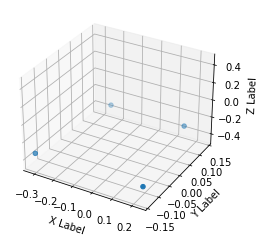


FL before: -0.341. FL after: -0.291215926409

FR before: -0.339. FR after: -0.32741394639

RL before: -0.341. RL after: -0.331827193499

RR before: -0.339. RR after: -0.291276961565
Footstep timestamp:  1628072085.35
Height check index:  2187
Height check timestamp:  1628072085.47

FL moving: 0.04978407359100001. FR moving: 0.011586053610000036
RL moving: 0.009172806501000053. RR moving: 0.04772303843500003

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  132
Skipping idx:  132  as flags not valid


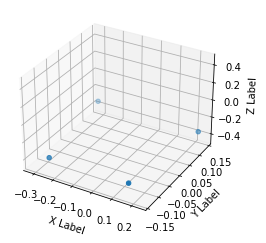


FL before: -0.337. FL after: -0.327441632748

FR before: -0.341. FR after: -0.290897965431

RL before: -0.339. RL after: -0.29109454155

RR before: -0.345. RR after: -0.330142587423
Footstep timestamp:  1628072085.67
Height check index:  2203
Height check timestamp:  1628072085.79

FL moving: 0.009558367252000044. FR moving: 0.05010203456900003
RL moving: 0.04790545845000005. RR moving: 0.014857412576999962

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  133
Skipping idx:  133  as flags not valid


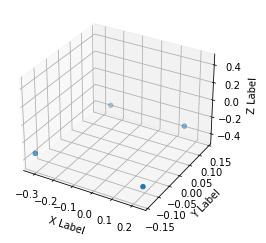


FL before: -0.341. FL after: -0.290965229273

FR before: -0.339. FR after: -0.327385246754

RL before: -0.341. RL after: -0.33169695735

RR before: -0.339. RR after: -0.291149705648
Footstep timestamp:  1628072086.01
Height check index:  2220
Height check timestamp:  1628072086.13

FL moving: 0.05003477072700002. FR moving: 0.011614753246000031
RL moving: 0.009303042650000037. RR moving: 0.047850294352

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  134
Skipping idx:  134  as flags not valid


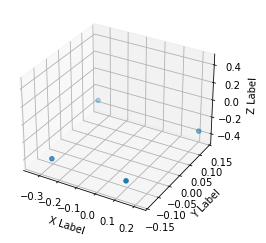


FL before: -0.337. FL after: -0.326472640038

FR before: -0.331. FR after: -0.289113968611

RL before: -0.329. RL after: -0.289918422699

RR before: -0.341. RR after: -0.328427702188
Footstep timestamp:  1628072086.37
Height check index:  2238
Height check timestamp:  1628072086.49

FL moving: 0.010527359962000049. FR moving: 0.04188603138899999
RL moving: 0.03908157730100004. RR moving: 0.012572297812000033

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  135
Skipping idx:  135  as flags not valid


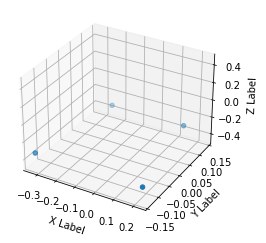


FL before: -0.336. FL after: -0.288715451956

FR before: -0.339. FR after: -0.326019853354

RL before: -0.34. RL after: -0.330053418875

RR before: -0.335. RR after: -0.289168059826
Footstep timestamp:  1628072086.69
Height check index:  2254
Height check timestamp:  1628072086.81

FL moving: 0.04728454804400001. FR moving: 0.012980146646000001
RL moving: 0.00994658112500002. RR moving: 0.045831940174

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  136
Skipping idx:  136  as flags not valid


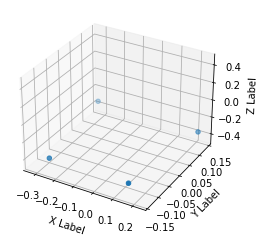


FL before: -0.337. FL after: -0.326459407806

FR before: -0.342. FR after: -0.289692163467

RL before: -0.339. RL after: -0.290548622608

RR before: -0.343. RR after: -0.327931165695
Footstep timestamp:  1628072087.03
Height check index:  2271
Height check timestamp:  1628072087.15

FL moving: 0.010540592193999998. FR moving: 0.05230783653300003
RL moving: 0.048451377392000006. RR moving: 0.015068834305

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  137
Skipping idx:  137  as flags not valid


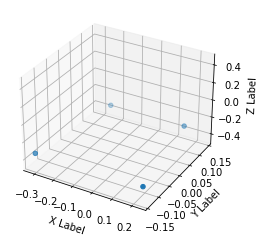


FL before: -0.341. FL after: -0.291044086218

FR before: -0.339. FR after: -0.327427864075

RL before: -0.341. RL after: -0.331823647022

RR before: -0.339. RR after: -0.291120588779
Footstep timestamp:  1628072087.31
Height check index:  2285
Height check timestamp:  1628072087.43

FL moving: 0.04995591378200004. FR moving: 0.011572135925000004
RL moving: 0.009176352978000013. RR moving: 0.047879411221000034

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  138
Skipping idx:  138  as flags not valid


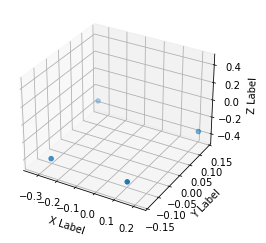


FL before: -0.337. FL after: -0.326610833406

FR before: -0.338. FR after: -0.289400607347

RL before: -0.335. RL after: -0.289688140154

RR before: -0.342. RR after: -0.327750355005
Footstep timestamp:  1628072087.67
Height check index:  2303
Height check timestamp:  1628072087.79

FL moving: 0.010389166594000021. FR moving: 0.048599392653000006
RL moving: 0.045311859846. RR moving: 0.014249644995000033

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  139
Skipping idx:  139  as flags not valid


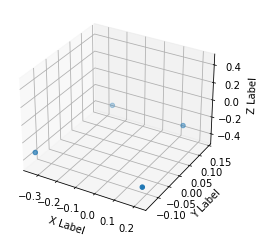


FL before: -0.33. FL after: -0.288844615221

FR before: -0.337. FR after: -0.32626760006

RL before: -0.339. RL after: -0.330131083727

RR before: -0.329. RR after: -0.288647085428
Footstep timestamp:  1628072087.99
Height check index:  2319
Height check timestamp:  1628072088.11

FL moving: 0.04115538477899999. FR moving: 0.010732399940000026
RL moving: 0.008868916273000016. RR moving: 0.04035291457200002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  140
Skipping idx:  140  as flags not valid


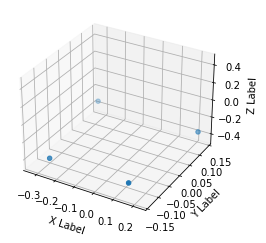


FL before: -0.337. FL after: -0.326698839664

FR before: -0.342. FR after: -0.289107203484

RL before: -0.338. RL after: -0.289991259575

RR before: -0.343. RR after: -0.328865468502
Footstep timestamp:  1628072088.31
Height check index:  2335
Height check timestamp:  1628072088.43

FL moving: 0.010301160336000037. FR moving: 0.05289279651600004
RL moving: 0.04800874042500003. RR moving: 0.014134531498000036

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  141
Skipping idx:  141  as flags not valid


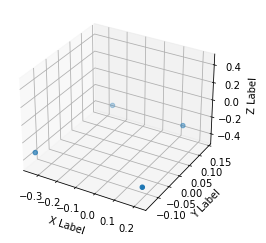


FL before: -0.331. FL after: -0.289334535599

FR before: -0.338. FR after: -0.326464444399

RL before: -0.339. RL after: -0.330748945475

RR before: -0.33. RR after: -0.289685428143
Footstep timestamp:  1628072088.63
Height check index:  2351
Height check timestamp:  1628072088.75

FL moving: 0.041665464400999996. FR moving: 0.011535555601000003
RL moving: 0.008251054525000023. RR moving: 0.04031457185699999

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  142
Skipping idx:  142  as flags not valid


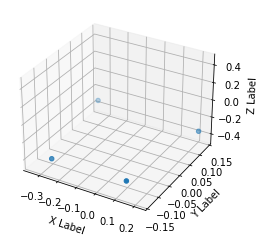


FL before: -0.336. FL after: -0.326227366924

FR before: -0.331. FR after: -0.291723251343

RL before: -0.329. RL after: -0.292435228825

RR before: -0.341. RR after: -0.32752764225
Footstep timestamp:  1628072088.99
Height check index:  2369
Height check timestamp:  1628072089.11

FL moving: 0.009772633076000015. FR moving: 0.03927674865700004
RL moving: 0.03656477117500001. RR moving: 0.013472357750000052

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  143
Skipping idx:  143  as flags not valid


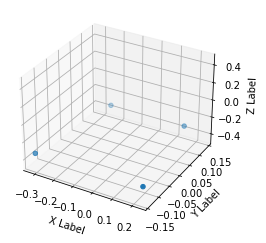


FL before: -0.341. FL after: -0.290589988232

FR before: -0.339. FR after: -0.327051609755

RL before: -0.341. RL after: -0.331580102444

RR before: -0.339. RR after: -0.290605634451
Footstep timestamp:  1628072089.27
Height check index:  2383
Height check timestamp:  1628072089.39

FL moving: 0.05041001176800003. FR moving: 0.011948390245000051
RL moving: 0.009419897556000034. RR moving: 0.04839436554900001

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  144
Skipping idx:  144  as flags not valid


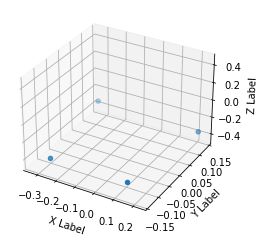


FL before: -0.338. FL after: -0.326829046011

FR before: -0.34. FR after: -0.289004713297

RL before: -0.337. RL after: -0.290004223585

RR before: -0.342. RR after: -0.328883081675
Footstep timestamp:  1628072089.59
Height check index:  2399
Height check timestamp:  1628072089.71

FL moving: 0.011170953989000032. FR moving: 0.05099528670300002
RL moving: 0.04699577641500002. RR moving: 0.013116918325000004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  145
Skipping idx:  145  as flags not valid


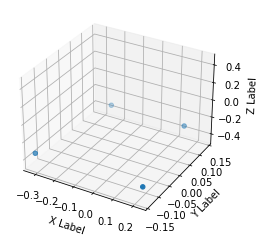


FL before: -0.34. FL after: -0.289215683937

FR before: -0.339. FR after: -0.326615840197

RL before: -0.341. RL after: -0.330591827631

RR before: -0.338. RR after: -0.28916439414
Footstep timestamp:  1628072089.93
Height check index:  2416
Height check timestamp:  1628072090.05

FL moving: 0.050784316063000046. FR moving: 0.012384159803000006
RL moving: 0.010408172369000046. RR moving: 0.04883560586000002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  146
Skipping idx:  146  as flags not valid


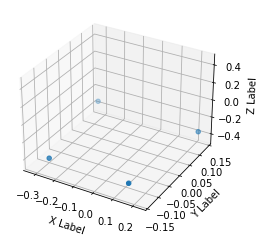


FL before: -0.337. FL after: -0.327211290598

FR before: -0.342. FR after: -0.289893299341

RL before: -0.339. RL after: -0.290132969618

RR before: -0.344. RR after: -0.329310566187
Footstep timestamp:  1628072090.25
Height check index:  2432
Height check timestamp:  1628072090.37

FL moving: 0.009788709401999995. FR moving: 0.05210670065900003
RL moving: 0.04886703038200002. RR moving: 0.014689433812999975

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  147
Skipping idx:  147  as flags not valid


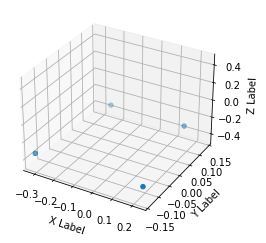


FL before: -0.341. FL after: -0.290043532848

FR before: -0.339. FR after: -0.326928198338

RL before: -0.341. RL after: -0.33121150732

RR before: -0.339. RR after: -0.29000762105
Footstep timestamp:  1628072090.57
Height check index:  2447
Height check timestamp:  1628072090.68

FL moving: 0.05095646715200003. FR moving: 0.012071801662000003
RL moving: 0.009788492680000038. RR moving: 0.048992378950000026

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  148
Skipping idx:  148  as flags not valid


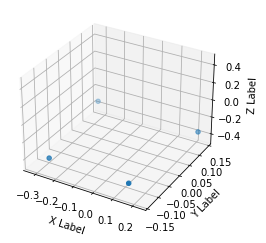


FL before: -0.337. FL after: -0.327880650759

FR before: -0.342. FR after: -0.292222559452

RL before: -0.339. RL after: -0.2928404212

RR before: -0.343. RR after: -0.330923050642
Footstep timestamp:  1628072090.9
Height check index:  2464
Height check timestamp:  1628072091.02

FL moving: 0.009119349240999997. FR moving: 0.04977744054800004
RL moving: 0.046159578800000045. RR moving: 0.012076949358000022

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  149
Skipping idx:  149  as flags not valid


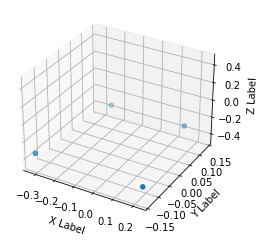


FL before: -0.34. FL after: -0.289623588324

FR before: -0.339. FR after: -0.326705813408

RL before: -0.341. RL after: -0.330865383148

RR before: -0.339. RR after: -0.29009065032
Footstep timestamp:  1628072091.23
Height check index:  2480
Height check timestamp:  1628072091.34

FL moving: 0.050376411676000044. FR moving: 0.012294186592000045
RL moving: 0.010134616852000011. RR moving: 0.04890934968000005

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  150
Skipping idx:  150  as flags not valid


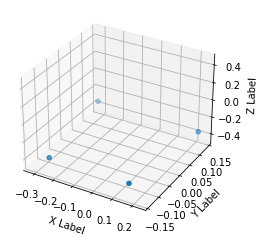


FL before: -0.337. FL after: -0.331283628941

FR before: -0.342. FR after: -0.301010668278

RL before: -0.339. RL after: -0.30065074563

RR before: -0.345. RR after: -0.335141628981
Footstep timestamp:  1628072091.53
Height check index:  2495
Height check timestamp:  1628072091.64

FL moving: 0.005716371059000025. FR moving: 0.04098933172200003
RL moving: 0.03834925437000003. RR moving: 0.009858371019

FL moving: False. FR moving: True
RL moving: True. RR moving: False
idx:  151

Coord FL: [0.227, 0.13, -0.337]. Coord FR: [0.162, -0.138, -0.342]. Coord RL: [-0.318, 0.138, -0.339]. Coord RR: [-0.247, -0.136, -0.345]

FR step_size x: 0.145567494035. FR step_size y: 0.011239393234000028. RL step_size x: 0.143371006012. RL step_size x: 0.0023810455799999908.


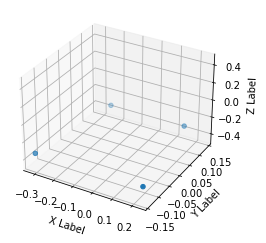


FL before: -0.341. FL after: -0.290095984936

FR before: -0.339. FR after: -0.326867222786

RL before: -0.341. RL after: -0.331309348345

RR before: -0.339. RR after: -0.290104269981
Footstep timestamp:  1628072091.87
Height check index:  2512
Height check timestamp:  1628072091.98

FL moving: 0.05090401506400005. FR moving: 0.012132777214000023
RL moving: 0.009690651655000049. RR moving: 0.04889573001900005

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  152
Skipping idx:  152  as flags not valid


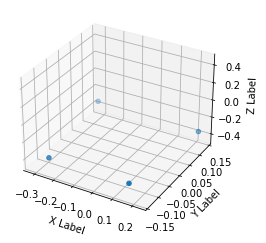


FL before: -0.337. FL after: -0.327388942242

FR before: -0.342. FR after: -0.290852636099

RL before: -0.34. RL after: -0.291698426008

RR before: -0.344. RR after: -0.330161720514
Footstep timestamp:  1628072092.2
Height check index:  2529
Height check timestamp:  1628072092.32

FL moving: 0.00961105775800003. FR moving: 0.051147363901000054
RL moving: 0.048301573992000024. RR moving: 0.013838279485999971

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  153
Skipping idx:  153  as flags not valid


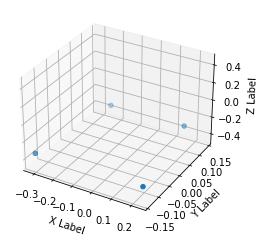


FL before: -0.341. FL after: -0.291902571917

FR before: -0.339. FR after: -0.327619463205

RL before: -0.341. RL after: -0.33209246397

RR before: -0.339. RR after: -0.29242888093
Footstep timestamp:  1628072092.52
Height check index:  2545
Height check timestamp:  1628072092.64

FL moving: 0.04909742808300005. FR moving: 0.011380536795000007
RL moving: 0.008907536030000052. RR moving: 0.04657111907

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  154
Skipping idx:  154  as flags not valid


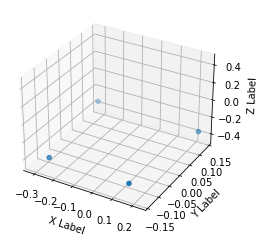


FL before: -0.337. FL after: -0.32781085372

FR before: -0.343. FR after: -0.292368769646

RL before: -0.34. RL after: -0.292948544025

RR before: -0.344. RR after: -0.330838114023
Footstep timestamp:  1628072092.84
Height check index:  2561
Height check timestamp:  1628072092.96

FL moving: 0.009189146280000005. FR moving: 0.05063123035400002
RL moving: 0.047051455975000045. RR moving: 0.013161885976999965

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  155
Skipping idx:  155  as flags not valid


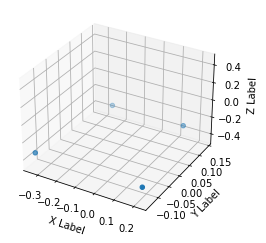


FL before: -0.334. FL after: -0.290610343218

FR before: -0.338. FR after: -0.325897216797

RL before: -0.34. RL after: -0.329419106245

RR before: -0.333. RR after: -0.290334135294
Footstep timestamp:  1628072093.2
Height check index:  2579
Height check timestamp:  1628072093.32

FL moving: 0.04338965678200002. FR moving: 0.012102783203000012
RL moving: 0.010580893755000043. RR moving: 0.042665864706000034

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  156
Skipping idx:  156  as flags not valid


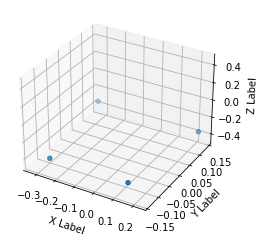


FL before: -0.338. FL after: -0.32939812541

FR before: -0.342. FR after: -0.296308100224

RL before: -0.339. RL after: -0.296407371759

RR before: -0.343. RR after: -0.333180129528
Footstep timestamp:  1628072093.5
Height check index:  2594
Height check timestamp:  1628072093.62

FL moving: 0.008601874590000003. FR moving: 0.04569189977600002
RL moving: 0.04259262824100002. RR moving: 0.009819870472000003

FL moving: False. FR moving: True
RL moving: True. RR moving: False
idx:  157

Coord FL: [0.223, 0.131, -0.338]. Coord FR: [0.151, -0.136, -0.342]. Coord RL: [-0.329, 0.138, -0.339]. Coord RR: [-0.251, -0.137, -0.343]

FR step_size x: 0.158053967476. FR step_size y: 0.005742331027999981. RL step_size x: 0.160966446877. RL step_size x: 0.0017091652159999804.


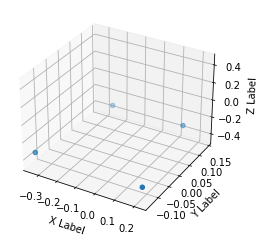


FL before: -0.33. FL after: -0.289248108864

FR before: -0.338. FR after: -0.326034188271

RL before: -0.339. RL after: -0.329829901457

RR before: -0.329. RR after: -0.289070785046
Footstep timestamp:  1628072093.86
Height check index:  2612
Height check timestamp:  1628072093.98

FL moving: 0.04075189113600003. FR moving: 0.01196581172900002
RL moving: 0.00917009854300005. RR moving: 0.039929214954000036

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  158
Skipping idx:  158  as flags not valid


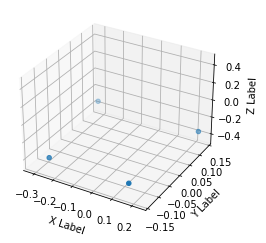


FL before: -0.337. FL after: -0.328177779913

FR before: -0.342. FR after: -0.292484134436

RL before: -0.339. RL after: -0.292754530907

RR before: -0.345. RR after: -0.331531107426
Footstep timestamp:  1628072094.14
Height check index:  2626
Height check timestamp:  1628072094.26

FL moving: 0.00882222008700001. FR moving: 0.049515865564000006
RL moving: 0.046245469093000036. RR moving: 0.013468892573999969

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  159
Skipping idx:  159  as flags not valid


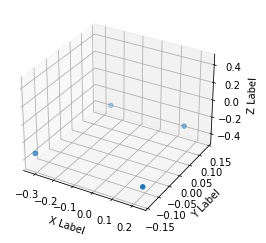


FL before: -0.341. FL after: -0.292116135359

FR before: -0.339. FR after: -0.327910542488

RL before: -0.341. RL after: -0.332294851542

RR before: -0.339. RR after: -0.292403042316
Footstep timestamp:  1628072094.46
Height check index:  2642
Height check timestamp:  1628072094.58

FL moving: 0.04888386464100003. FR moving: 0.011089457512000023
RL moving: 0.008705148458000023. RR moving: 0.04659695768400002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  160
Skipping idx:  160  as flags not valid


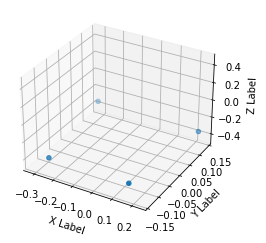


FL before: -0.337. FL after: -0.327401012182

FR before: -0.342. FR after: -0.290810108185

RL before: -0.34. RL after: -0.291182875633

RR before: -0.344. RR after: -0.330160975456
Footstep timestamp:  1628072094.8
Height check index:  2659
Height check timestamp:  1628072094.92

FL moving: 0.009598987818000004. FR moving: 0.051189891815
RL moving: 0.04881712436700003. RR moving: 0.01383902454399999

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  161
Skipping idx:  161  as flags not valid


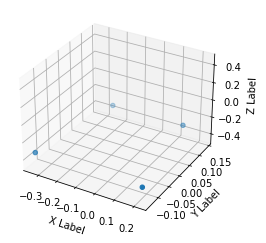


FL before: -0.33. FL after: -0.289035797119

FR before: -0.338. FR after: -0.325970321894

RL before: -0.339. RL after: -0.329707831144

RR before: -0.33. RR after: -0.289462417364
Footstep timestamp:  1628072095.16
Height check index:  2677
Height check timestamp:  1628072095.28

FL moving: 0.040964202881. FR moving: 0.01202967810600003
RL moving: 0.009292168856000038. RR moving: 0.04053758263599999

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  162
Skipping idx:  162  as flags not valid


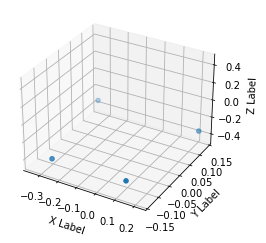


FL before: -0.336. FL after: -0.326499074697

FR before: -0.331. FR after: -0.289038896561

RL before: -0.329. RL after: -0.289944797754

RR before: -0.34. RR after: -0.328177005053
Footstep timestamp:  1628072095.48
Height check index:  2693
Height check timestamp:  1628072095.6

FL moving: 0.009500925303000007. FR moving: 0.041961103439
RL moving: 0.03905520224600001. RR moving: 0.01182299494700001

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  163
Skipping idx:  163  as flags not valid


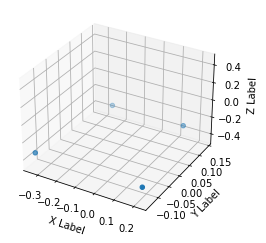


FL before: -0.334. FL after: -0.288898587227

FR before: -0.338. FR after: -0.326143175364

RL before: -0.34. RL after: -0.329836606979

RR before: -0.333. RR after: -0.289244174957
Footstep timestamp:  1628072095.8
Height check index:  2709
Height check timestamp:  1628072095.92

FL moving: 0.045101412773000005. FR moving: 0.011856824636000018
RL moving: 0.010163393021. RR moving: 0.04375582504300002

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  164
Skipping idx:  164  as flags not valid


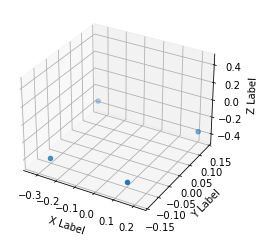


FL before: -0.337. FL after: -0.326702237129

FR before: -0.34. FR after: -0.289116591215

RL before: -0.337. RL after: -0.289381861687

RR before: -0.342. RR after: -0.328121572733
Footstep timestamp:  1628072096.12
Height check index:  2725
Height check timestamp:  1628072096.24

FL moving: 0.010297762871000038. FR moving: 0.05088340878500003
RL moving: 0.04761813831300005. RR moving: 0.013878427267000004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  165
Skipping idx:  165  as flags not valid


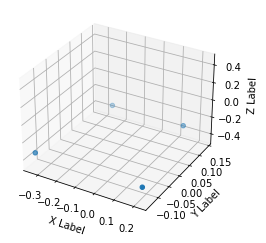


FL before: -0.334. FL after: -0.289238005877

FR before: -0.338. FR after: -0.326126039028

RL before: -0.34. RL after: -0.329521268606

RR before: -0.333. RR after: -0.288983970881
Footstep timestamp:  1628072096.46
Height check index:  2742
Height check timestamp:  1628072096.58

FL moving: 0.044761994123000026. FR moving: 0.011873960971999997
RL moving: 0.010478731394000018. RR moving: 0.044016029119000044

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  166
Skipping idx:  166  as flags not valid


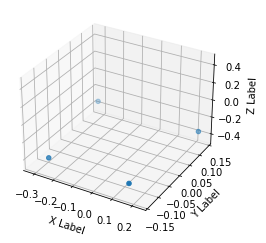


FL before: -0.337. FL after: -0.327542543411

FR before: -0.343. FR after: -0.29145655036

RL before: -0.34. RL after: -0.29171821475

RR before: -0.345. RR after: -0.330422073603
Footstep timestamp:  1628072096.74
Height check index:  2756
Height check timestamp:  1628072096.86

FL moving: 0.009457456589000046. FR moving: 0.051543449640000016
RL moving: 0.04828178525000004. RR moving: 0.014577926396999952

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  167
Skipping idx:  167  as flags not valid


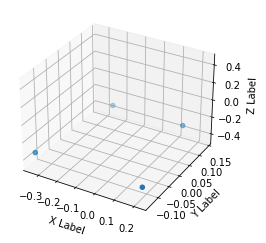


FL before: -0.331. FL after: -0.291873842478

FR before: -0.338. FR after: -0.325916200876

RL before: -0.339. RL after: -0.329139500856

RR before: -0.33. RR after: -0.291599780321
Footstep timestamp:  1628072097.1
Height check index:  2774
Height check timestamp:  1628072097.22

FL moving: 0.039126157521999994. FR moving: 0.012083799124000039
RL moving: 0.009860499144000001. RR moving: 0.038400219679000036

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  168
Skipping idx:  168  as flags not valid


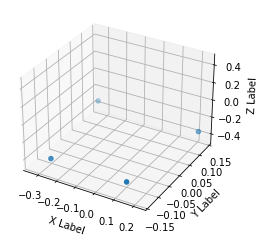


FL before: -0.338. FL after: -0.327608436346

FR before: -0.338. FR after: -0.290984660387

RL before: -0.335. RL after: -0.291673004627

RR before: -0.342. RR after: -0.330328732729
Footstep timestamp:  1628072097.4
Height check index:  2789
Height check timestamp:  1628072097.52

FL moving: 0.010391563654000013. FR moving: 0.04701533961300003
RL moving: 0.043326995373. RR moving: 0.011671267271000041

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  169
Skipping idx:  169  as flags not valid


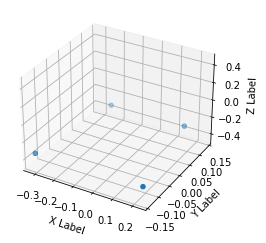


FL before: -0.341. FL after: -0.291604369879

FR before: -0.339. FR after: -0.327403575182

RL before: -0.341. RL after: -0.331921964884

RR before: -0.339. RR after: -0.291914463043
Footstep timestamp:  1628072097.72
Height check index:  2805
Height check timestamp:  1628072097.84

FL moving: 0.04939563012100001. FR moving: 0.01159642481800005
RL moving: 0.009078035116000027. RR moving: 0.04708553695700002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  170
Skipping idx:  170  as flags not valid


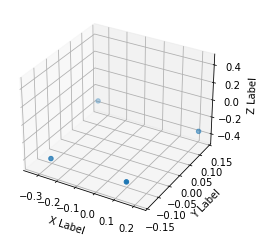


FL before: -0.337. FL after: -0.326862841845

FR before: -0.338. FR after: -0.289295703173

RL before: -0.335. RL after: -0.289960801601

RR before: -0.342. RR after: -0.328274220228
Footstep timestamp:  1628072098.08
Height check index:  2823
Height check timestamp:  1628072098.2

FL moving: 0.010137158155000048. FR moving: 0.048704296827000004
RL moving: 0.045039198399. RR moving: 0.013725779772000013

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  171
Skipping idx:  171  as flags not valid


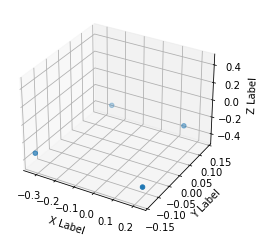


FL before: -0.339. FL after: -0.288986295462

FR before: -0.339. FR after: -0.326300531626

RL before: -0.341. RL after: -0.330484390259

RR before: -0.337. RR after: -0.289387851954
Footstep timestamp:  1628072098.4
Height check index:  2839
Height check timestamp:  1628072098.52

FL moving: 0.050013704538000026. FR moving: 0.012699468374000045
RL moving: 0.01051560974100002. RR moving: 0.047612148046

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  172
Skipping idx:  172  as flags not valid


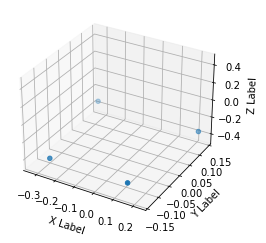


FL before: -0.337. FL after: -0.326836377382

FR before: -0.342. FR after: -0.289629459381

RL before: -0.339. RL after: -0.290388613939

RR before: -0.343. RR after: -0.329209119081
Footstep timestamp:  1628072098.72
Height check index:  2855
Height check timestamp:  1628072098.84

FL moving: 0.010163622618000023. FR moving: 0.05237054061900004
RL moving: 0.04861138606100002. RR moving: 0.013790880919000048

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  173
Skipping idx:  173  as flags not valid


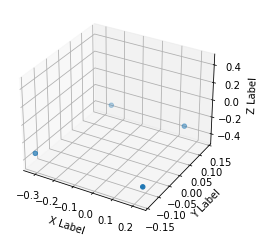


FL before: -0.341. FL after: -0.289575487375

FR before: -0.339. FR after: -0.326758235693

RL before: -0.341. RL after: -0.330692350864

RR before: -0.339. RR after: -0.289654552937
Footstep timestamp:  1628072099.04
Height check index:  2871
Height check timestamp:  1628072099.16

FL moving: 0.05142451262500003. FR moving: 0.012241764307000025
RL moving: 0.010307649136000019. RR moving: 0.049345447063000036

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  174
Skipping idx:  174  as flags not valid


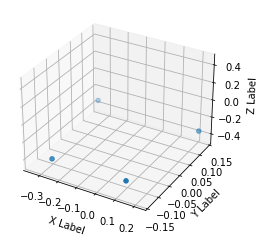


FL before: -0.336. FL after: -0.326423168182

FR before: -0.331. FR after: -0.293715536594

RL before: -0.329. RL after: -0.293925464153

RR before: -0.341. RR after: -0.327183693647
Footstep timestamp:  1628072099.4
Height check index:  2889
Height check timestamp:  1628072099.52

FL moving: 0.009576831818000009. FR moving: 0.037284463406
RL moving: 0.03507453584699999. RR moving: 0.013816306353000019

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  175
Skipping idx:  175  as flags not valid


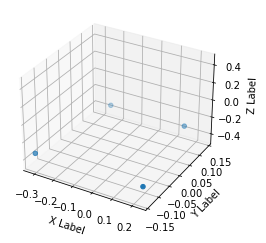


FL before: -0.341. FL after: -0.29073959589

FR before: -0.339. FR after: -0.327156275511

RL before: -0.341. RL after: -0.331531018019

RR before: -0.339. RR after: -0.291177451611
Footstep timestamp:  1628072099.68
Height check index:  2903
Height check timestamp:  1628072099.8

FL moving: 0.050260404110000045. FR moving: 0.011843724489000007
RL moving: 0.009468981981000046. RR moving: 0.04782254838900002

FL moving: True. FR moving: True
RL moving: False. RR moving: True
idx:  176
Skipping idx:  176  as flags not valid


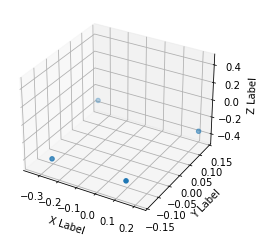


FL before: -0.336. FL after: -0.326649725437

FR before: -0.331. FR after: -0.289467334747

RL before: -0.329. RL after: -0.289739817381

RR before: -0.341. RR after: -0.327786237001
Footstep timestamp:  1628072100.04
Height check index:  2921
Height check timestamp:  1628072100.16

FL moving: 0.009350274563000027. FR moving: 0.041532665253000034
RL moving: 0.039260182618999995. RR moving: 0.013213762999000012

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  177
Skipping idx:  177  as flags not valid


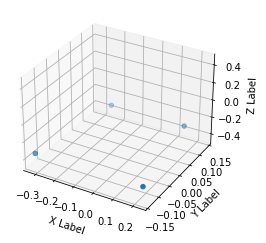


FL before: -0.341. FL after: -0.28920212388

FR before: -0.339. FR after: -0.325998425484

RL before: -0.341. RL after: -0.329750448465

RR before: -0.339. RR after: -0.289583712816
Footstep timestamp:  1628072100.36
Height check index:  2937
Height check timestamp:  1628072100.48

FL moving: 0.05179787612000003. FR moving: 0.013001574516000036
RL moving: 0.011249551535000013. RR moving: 0.04941628718400004

FL moving: True. FR moving: True
RL moving: True. RR moving: True
idx:  178
Skipping idx:  178  as flags not valid


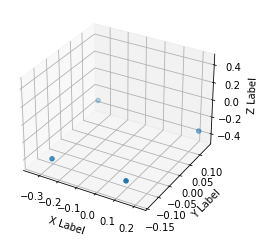


FL before: -0.336. FL after: -0.326709240675

FR before: -0.331. FR after: -0.289098352194

RL before: -0.329. RL after: -0.289480060339

RR before: -0.341. RR after: -0.328213721514
Footstep timestamp:  1628072100.68
Height check index:  2953
Height check timestamp:  1628072100.8

FL moving: 0.009290759325000009. FR moving: 0.04190164780600003
RL moving: 0.039519939661000036. RR moving: 0.012786278486000002

FL moving: False. FR moving: True
RL moving: True. RR moving: True
idx:  179
Skipping idx:  179  as flags not valid


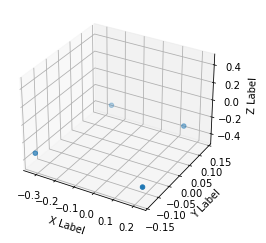

In [41]:
def visualize_absolute_foostep_sizes(dataset, footsteps, threshold=0.02):    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 7:19] = np.round(dataset[footstep, 7:19], 3)
                    
        # 3D positions
        xs = np.array([dataset[footstep, 7], dataset[footstep, 10], dataset[footstep, 13], dataset[footstep, 16]])
        ys = np.array([dataset[footstep, 8], dataset[footstep, 11], dataset[footstep, 14], dataset[footstep, 17]])
        zs = np.array([dataset[footstep, 9], dataset[footstep, 12], dataset[footstep, 15], dataset[footstep, 18]])

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()
        
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
        
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.12))
                idx_height_check = absolute_val_array.argmin()

                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9])
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12])
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15])
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18])
                
                print(f'\nFL before: {dataset[footstep, 9]}. FL after: {dataset[idx_height_check, 9]}')
                print(f'\nFR before: {dataset[footstep, 12]}. FR after: {dataset[idx_height_check, 12]}')
                print(f'\nRL before: {dataset[footstep, 15]}. RL after: {dataset[idx_height_check, 15]}')
                print(f'\nRR before: {dataset[footstep, 18]}. RR after: {dataset[idx_height_check, 18]}')

                print("Footstep timestamp: ", dataset[footstep, 0])
                print("Height check index: ", idx_height_check)
                print("Height check timestamp: ", dataset[idx_height_check, 0])

                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                print(f'\nFL moving: {fl_moving > threshold}. FR moving: {fr_moving > threshold}')
                print(f'RL moving: {rl_moving > threshold}. RR moving: {rr_moving > threshold}')
                
                print("idx: ", idx)

                valid_1 = (fr_moving > threshold) == (rl_moving > threshold)
                valid_2 = (rr_moving > threshold) == (fl_moving > threshold)
                valid_3 = (fr_moving > threshold) != (fl_moving > threshold)

                if (not valid_1 or not valid_2 or not valid_3):
                    print("Skipping idx: ", idx, " as flags not valid")
                    continue
                    
                
                # Compute FR movement
                fl_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                fl_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))

                # Compute FL movement
                fr_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                fr_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))

                # Compute RR movement
                rl_movement_x = abs(abs(dataset[footstep, 13]) - abs(dataset[footsteps[idx+1], 13]))
                rl_movement_y = abs(abs(dataset[footstep, 14]) - abs(dataset[footsteps[idx+1], 14]))

                # Compute RL movement
                rr_movement_x = abs(abs(dataset[footstep, 16]) - abs(dataset[footsteps[idx+1], 16]))
                rr_movement_y = abs(abs(dataset[footstep, 17]) - abs(dataset[footsteps[idx+1], 17]))


                print(f'\nCoord FL: {[xs[0], ys[0], zs[0]]}. Coord FR: {[xs[1], ys[1], zs[1]]}. Coord RL: {[xs[2], ys[2], zs[2]]}. Coord RR: {[xs[3], ys[3], zs[3]]}')

                if fr_moving:
                    print(f'\nFR step_size x: {fr_movement_x + fl_movement_x}. FR step_size y: {fr_movement_y + fl_movement_y}. RL step_size x: {rl_movement_x + rr_movement_x}. RL step_size x: {rl_movement_y + rr_movement_y}.')
                elif fl_moving:
                    print(f'\nFL step_size x: {fr_movement_x + fl_movement_x}. FL step_size y: {fr_movement_y + fl_movement_y}. RR step_size x: {rl_movement_x + rr_movement_x}. RR step_size x: {rl_movement_y + rr_movement_y}.')
                else:
                    print("\nERROR")

visualize_absolute_foostep_sizes(motion_025_fwd, footsteps_025_fwd, threshold=0.01)

### Forward motion

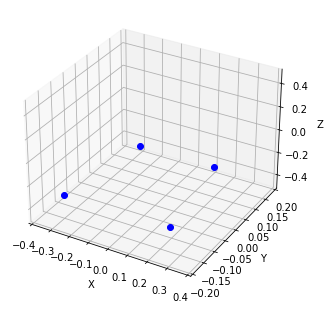

In [42]:
anim = visualize_animated_footsteps(motion_025_fwd, footsteps_025_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

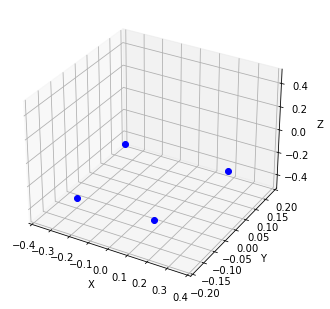

In [43]:
anim = visualize_animated_footsteps(motion_025_bwd, footsteps_025_bwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

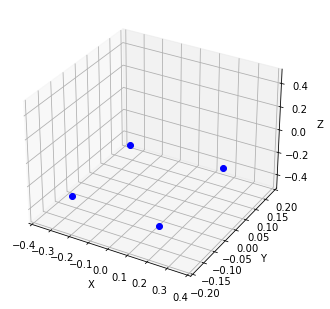

In [44]:
anim = visualize_animated_footsteps(motion_025_side_right, footsteps_025_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

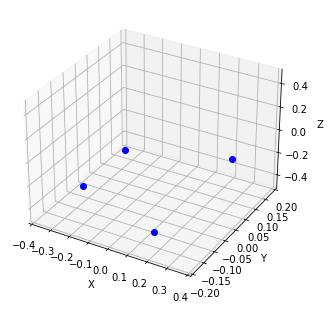

In [45]:
anim = visualize_animated_footsteps(motion_025_side_left, footsteps_025_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

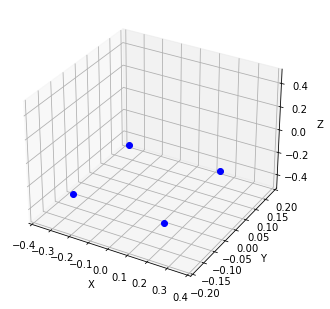

In [46]:
anim = visualize_animated_footsteps(motion_025_clock, footsteps_025_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

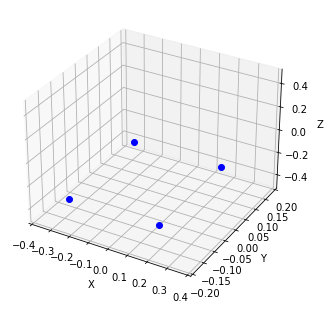

In [47]:
anim = visualize_animated_footsteps(motion_025_count, footsteps_025_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [48]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [49]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [50]:
def create_timestamp_consistent_dataset(dataset, footsteps):
    # Footsteps sizes
    inputs = []
    labels = []
        
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 1.0:
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                labels.append(dataset[footsteps[idx], 7:19])
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_025_fwd_3D, Y_motion_025_fwd_3D = create_timestamp_consistent_dataset(motion_025_fwd, footsteps_025_fwd)
X_motion_025_bwd_3D, Y_motion_025_bwd_3D = create_timestamp_consistent_dataset(motion_025_bwd, footsteps_025_bwd)
X_motion_025_clock_3D, Y_motion_025_clock_3D = create_timestamp_consistent_dataset(motion_025_clock, footsteps_025_clock)
X_motion_025_count_3D, Y_motion_025_count_3D = create_timestamp_consistent_dataset(motion_025_count, footsteps_025_count)
X_motion_025_side_left_3D, Y_motion_025_side_left_3D = create_timestamp_consistent_dataset(motion_025_side_left, footsteps_025_side_left)
X_motion_025_side_right_3D, Y_motion_025_side_right_3D = create_timestamp_consistent_dataset(motion_025_side_right, footsteps_025_side_right)

# Stack datasets
X_motion_025_3D = np.concatenate((X_motion_025_fwd_3D, X_motion_025_bwd_3D, X_motion_025_side_right_3D, X_motion_025_side_left_3D, X_motion_025_clock_3D, X_motion_025_count_3D))
Y_motion_025_3D = np.concatenate((Y_motion_025_fwd_3D, Y_motion_025_bwd_3D, Y_motion_025_side_right_3D, Y_motion_025_side_left_3D, Y_motion_025_clock_3D, Y_motion_025_count_3D))

In [51]:
%store X_motion_025_3D
%store Y_motion_025_3D

Stored 'X_motion_025_3D' (ndarray)
Stored 'Y_motion_025_3D' (ndarray)


In [52]:
def create_timestamp_consistent_dataset_with_step_size_labels(dataset, footsteps, threshold=0.02):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
                
                # Find closest timestamp with gap of 0.12 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.12))
                idx_height_check = absolute_val_array.argmin()
                
                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9]) > threshold
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12]) > threshold
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15]) > threshold
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18]) > threshold

                valid_1 = (fr_moving > threshold) == (rl_moving > threshold)
                valid_2 = (rr_moving > threshold) == (fl_moving > threshold)
                valid_3 = (fr_moving > threshold) != (fl_moving > threshold)

                if (not valid_1 or not valid_2 or not valid_3):
                    print("Skipping idx: ", idx, " as flags not valid")
                    continue
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                fl_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))

                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                fr_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))

                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 13]) - abs(dataset[footsteps[idx+1], 13]))
                rl_movement_y = abs(abs(dataset[footstep, 14]) - abs(dataset[footsteps[idx+1], 14]))

                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 16]) - abs(dataset[footsteps[idx+1], 16]))
                rr_movement_y = abs(abs(dataset[footstep, 17]) - abs(dataset[footsteps[idx+1], 17]))
                
                # Compute new feet position w.r.t old centre of mass
                fl_x = dataset[footstep, 7] + (fr_movement_x + fl_movement_x)
                fl_y = dataset[footstep, 8] + (fr_movement_y + fl_movement_y)
                fr_x = dataset[footstep, 10] + (fr_movement_x + fl_movement_x)
                fr_y = dataset[footstep, 11] + (fr_movement_y + fl_movement_y)
                rl_x = dataset[footstep, 13] + (rr_movement_x + rl_movement_x)
                rl_y = dataset[footstep, 14] + (rr_movement_y + rl_movement_y)
                rr_x = dataset[footstep, 16] + (rr_movement_x + rl_movement_x)
                rr_y = dataset[footstep, 17] + (rr_movement_y + rl_movement_y)

                label = []

                if fr_moving:
                    label.append([dataset[footstep, 7], dataset[footstep, 8], fr_x, fr_y, rl_x, rl_y, dataset[footstep, 16], dataset[footstep, 17]])
                elif fl_moving:
                    label.append([fl_x, fl_y, dataset[footstep, 10], dataset[footstep, 11], dataset[footstep, 13], dataset[footstep, 14], rr_x, rr_y])
                else:
                    print("\nERROR")

                labels.append(label)
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy.reshape(labels_numpy.shape[0], labels_numpy.shape[2])

X_motion_025_fwd_step, Y_motion_025_fwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_fwd, footsteps_025_fwd)
X_motion_025_bwd_step, Y_motion_025_bwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_bwd, footsteps_025_bwd)
X_motion_025_clock_step, Y_motion_025_clock_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_clock, footsteps_025_clock)
X_motion_025_count_step, Y_motion_025_count_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_count, footsteps_025_count)
X_motion_025_side_left_step, Y_motion_025_side_left_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_side_left, footsteps_025_side_left)
X_motion_025_side_right_step, Y_motion_025_side_right_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_025_side_right, footsteps_025_side_right)

# Stack datasets
X_motion_025_step = np.concatenate((X_motion_025_fwd_step, X_motion_025_bwd_step, X_motion_025_side_right_step, X_motion_025_side_left_step, X_motion_025_clock_step, X_motion_025_count_step))
Y_motion_025_step = np.concatenate((Y_motion_025_fwd_step, Y_motion_025_bwd_step, Y_motion_025_side_right_step, Y_motion_025_side_left_step, Y_motion_025_clock_step, Y_motion_025_count_step))

Skipping idx:  158  as flags not valid
Skipping idx:  23  as flags not valid
Skipping idx:  159  as flags not valid
Skipping idx:  0  as flags not valid


In [53]:
%store X_motion_025_step
%store Y_motion_025_step

Stored 'X_motion_025_step' (ndarray)
Stored 'Y_motion_025_step' (ndarray)


In [54]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} motion\n')
    
    # Find all positive movements in x and y for FR
    fr_steps_x = np.where(dataset[:, 0] > 0)[0]
    fr_steps_y = np.where(dataset[:, 1] > 0)[0]
    
    # Find all positive movements in x and y for FR
    fl_steps_x = np.where(dataset[:, 2] > 0)[0]
    fl_steps_y = np.where(dataset[:, 3] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rr_steps_x = np.where(dataset[:, 4] > 0)[0]
    rr_steps_y = np.where(dataset[:, 5] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rl_steps_x = np.where(dataset[:, 6] > 0)[0]
    rl_steps_y = np.where(dataset[:, 7] > 0)[0]
    
    # Compute stats for FR foot
    print(f'FR mean x step: {np.mean(dataset[fr_steps_x, 0])}. FR std x step: {np.std(dataset[fr_steps_x, 0])}. FR mean y step: {np.mean(dataset[fr_steps_y, 1])}. FR std y step: {np.std(dataset[fr_steps_y, 1])}')
 
    # Compute stats for FL foot
    print(f'FL mean x step: {np.mean(dataset[fl_steps_x, 2])}. FL std x step: {np.std(dataset[fl_steps_x, 2])}. FL mean y step: {np.mean(dataset[fl_steps_y, 3])}. FL std y step: {np.std(dataset[fl_steps_y, 3])}')
    
    # Compute stats for RR foot
    print(f'RR mean x step: {np.mean(dataset[rr_steps_x, 4])}. RR std x step: {np.std(dataset[rr_steps_x, 4])}. RR mean y step: {np.mean(dataset[rr_steps_y, 5])}. RR std y step: {np.std(dataset[rr_steps_y, 5])}')
    
    # Compute stats for RL foot
    print(f'RL mean x step: {np.mean(dataset[rl_steps_x, 6])}. RL std x step: {np.std(dataset[rl_steps_x, 6])}. RL mean y step: {np.mean(dataset[rl_steps_y, 7])}. RL std y step: {np.std(dataset[rl_steps_y, 7])}\n')
    
labels_stats(Y_motion_025_fwd_step, "forward")
labels_stats(Y_motion_025_bwd_step, "backward")
labels_stats(Y_motion_025_clock_step, "clockwise")
labels_stats(Y_motion_025_count_step, "counter clockwise")
labels_stats(Y_motion_025_side_left_step, "left step")
labels_stats(Y_motion_025_side_right_step, "right step")

Statistics for forward motion

FR mean x step: 0.25990555555555556. FR std x step: 0.0374901019859053. FR mean y step: 0.1385. FR std y step: 0.008070866675202175
FL mean x step: 0.26461111111111113. FL std x step: 0.04069962993128083. FL mean y step: nan. FL std y step: nan
RR mean x step: nan. RR std x step: nan. RR mean y step: 0.13882777777777777. RR std y step: 0.001010118560453594
RL mean x step: nan. RL std x step: nan. RL mean y step: nan. RL std y step: nan

Statistics for backward motion

FR mean x step: 0.27832960893854747. FR std x step: 0.1326456099476894. FR mean y step: 0.13878212290502798. FR std y step: 0.007466312721877652
FL mean x step: 0.2746033519553072. FL std x step: 0.12533514485670183. FL mean y step: nan. FL std y step: nan
RR mean x step: nan. RR std x step: nan. RR mean y step: 0.1374078212290503. RR std y step: 0.0016464436878323421
RL mean x step: nan. RL std x step: nan. RL mean y step: nan. RL std y step: nan

Statistics for clockwise motion

FR mean x 

/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/itaouil/miniconda3/envs/pytorch-env/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [55]:
def getCoMDataset(dataset, footsteps, threshold=0.02):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 1.0:
                
                # Find closest timestamp with gap of 0.12 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 0.12))
                idx_height_check = absolute_val_array.argmin()
                
                fl_moving = np.abs(dataset[footstep, 9] - dataset[idx_height_check, 9]) > threshold
                fr_moving = np.abs(dataset[footstep, 12] - dataset[idx_height_check, 12]) > threshold
                rl_moving = np.abs(dataset[footstep, 15] - dataset[idx_height_check, 15]) > threshold
                rr_moving = np.abs(dataset[footstep, 18] - dataset[idx_height_check, 18]) > threshold

                valid_1 = (fr_moving > threshold) == (rl_moving > threshold)
                valid_2 = (rr_moving > threshold) == (fl_moving > threshold)
                valid_3 = (fr_moving > threshold) != (fl_moving > threshold)

                if (not valid_1 or not valid_2 or not valid_3):
                    print("Skipping idx: ", idx, " as flags not valid")
                    continue
                    
                # CoM absolute movement
                com_movement_x = None
                com_movement_y = None
                com_movement_theta = None
                
                # Compute CoM absolute movement
                if fr_moving:
                    com_movement_x = abs(abs(dataset[footstep, 7]) - abs(dataset[footsteps[idx+1], 7]))
                    com_movement_y = abs(abs(dataset[footstep, 8]) - abs(dataset[footsteps[idx+1], 8]))
                    com_movement_theta = np.arctan2(com_movement_y, com_movement_x) * 180 / np.pi
                elif fl_moving:
                    com_movement_x = abs(abs(dataset[footstep, 10]) - abs(dataset[footsteps[idx+1], 10]))
                    com_movement_y = abs(abs(dataset[footstep, 11]) - abs(dataset[footsteps[idx+1], 11]))
                    com_movement_theta = np.arctan2(com_movement_y, com_movement_x) * 180 / np.pi
                else:
                    print("\nERROR")

                labels.append([com_movement_x, com_movement_y, com_movement_theta])
                inputs.append(dataset[footsteps[idx-1], 1:7].tolist() + dataset[footsteps[idx-1], 7:19].tolist())
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_025_fwd_CoM_step, Y_motion_025_fwd_CoM_step = getCoMDataset(motion_025_fwd, footsteps_025_fwd)
X_motion_025_bwd_CoM_step, Y_motion_025_bwd_CoM_step = getCoMDataset(motion_025_bwd, footsteps_025_bwd)
X_motion_025_clock_CoM_step, Y_motion_025_clock_CoM_step = getCoMDataset(motion_025_clock, footsteps_025_clock)
X_motion_025_count_CoM_step, Y_motion_025_count_CoM_step = getCoMDataset(motion_025_count, footsteps_025_count)
X_motion_025_side_left_CoM_step, Y_motion_025_side_left_CoM_step = getCoMDataset(motion_025_side_left, footsteps_025_side_left)
X_motion_025_side_right_CoM_step, Y_motion_025_side_right_CoM_step = getCoMDataset(motion_025_side_right, footsteps_025_side_right)

# Stack datasets
X_motion_025_CoM_step = np.concatenate((X_motion_025_fwd_CoM_step, X_motion_025_bwd_CoM_step, X_motion_025_side_right_CoM_step, X_motion_025_side_left_CoM_step, X_motion_025_clock_CoM_step, X_motion_025_count_CoM_step))
Y_motion_025_CoM_step = np.concatenate((Y_motion_025_fwd_CoM_step, Y_motion_025_bwd_CoM_step, Y_motion_025_side_right_CoM_step, Y_motion_025_side_left_CoM_step, Y_motion_025_clock_CoM_step, Y_motion_025_count_CoM_step))

Skipping idx:  158  as flags not valid
Skipping idx:  23  as flags not valid
Skipping idx:  159  as flags not valid
Skipping idx:  0  as flags not valid


In [56]:
%store X_motion_025_CoM_step
%store Y_motion_025_CoM_step

Stored 'X_motion_025_CoM_step' (ndarray)
Stored 'Y_motion_025_CoM_step' (ndarray)


In [59]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} CoM motion')
    
    # Compute stats for FR foot
    print(f'CoM mean x step: {round(np.mean(dataset[:, 0]), 3)}. CoM mean y step: {round(np.mean(dataset[:, 1]), 3)}. CoM std x step: {round(np.std(dataset[:, 0]), 3)}. CoM std y step: {round(np.std(dataset[:, 1]), 3)}.\n')

labels_stats(Y_motion_025_fwd_CoM_step, "forward")
labels_stats(Y_motion_025_bwd_CoM_step, "backward")
labels_stats(Y_motion_025_clock_CoM_step, "clockwise")
labels_stats(Y_motion_025_count_CoM_step, "counter clockwise")
labels_stats(Y_motion_025_side_left_CoM_step, "left step")
labels_stats(Y_motion_025_side_right_CoM_step, "right step")

Statistics for forward CoM motion
CoM mean x step: 0.077. CoM mean y step: 0.004. CoM std x step: 0.01. CoM std y step: 0.003.

Statistics for backward CoM motion
CoM mean x step: 0.086. CoM mean y step: 0.005. CoM std x step: 0.011. CoM std y step: 0.001.

Statistics for clockwise CoM motion
CoM mean x step: 0.012. CoM mean y step: 0.015. CoM std x step: 0.006. CoM std y step: 0.003.

Statistics for counter clockwise CoM motion
CoM mean x step: 0.01. CoM mean y step: 0.017. CoM std x step: 0.004. CoM std y step: 0.005.

Statistics for left step CoM motion
CoM mean x step: 0.008. CoM mean y step: 0.086. CoM std x step: 0.007. CoM std y step: 0.019.

Statistics for right step CoM motion
CoM mean x step: 0.005. CoM mean y step: 0.087. CoM std x step: 0.003. CoM std y step: 0.012.



In [62]:
print(f'Rotation in rad for clockwise {np.arctan(np.mean(Y_motion_025_clock_CoM_step[:, 1]) / -np.mean(Y_motion_025_clock_CoM_step[:, 0]))}')
print(f'Rotation in angles for clockwise {np.arctan(np.mean(Y_motion_025_clock_CoM_step[:, 1]) / -np.mean(Y_motion_025_clock_CoM_step[:, 0])) * 180 / np.pi}')

Rotation in rad for clockwise -0.9196110017756136
Rotation in angles for clockwise -52.68982919554031


In [63]:
print(f'Rotation in rad for count {np.arctan(np.mean(Y_motion_025_clock_CoM_step[:, 1]) / np.mean(Y_motion_025_clock_CoM_step[:, 0]))}')
print(f'Rotation in angles for count {np.arctan(np.mean(Y_motion_025_clock_CoM_step[:, 1]) / np.mean(Y_motion_025_clock_CoM_step[:, 0])) * 180 / np.pi}')

Rotation in rad for count 0.9196110017756136
Rotation in angles for count 52.68982919554031
